# Utilities and imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from maxentnuc.analysis.domain_analyzer import DomainAnalyzer, get_boundary_loops, Domains
from maxentnuc.analysis.mei_analyzer import MEIAnalyzer
from maxentnuc.analysis.analysis import *
from maxentnuc.analysis.insulation import *

from scipy.ndimage import gaussian_filter1d
from matplotlib.colors import LogNorm
import os
from cooltools.api.insulation import _insul_diamond_dense
from neighbor_balance.plotting import parse_region, format_ticks, ContactMap, apply_matplotlib_style, load_bw, bin_track, stylize_gene_name, fixed_panel_grid

def plot_gallery_list(domains, func=lambda x, ax: x.plot_chain_2D(ax=ax, colorbar=False, s=1), size=500, rows=3, scalebar=500, fname=None):
    assert not len(domains) % rows
    cols = len(domains) // rows
    assert cols < 10

    aspect = 0.6
    size_h = size * aspect
    f, ax = plt.subplots(rows, cols, sharex=True, sharey=True, figsize=(3*cols, 3*rows*aspect),
                         gridspec_kw=dict(hspace=0, wspace=0))

    axs = ax.flatten()
    
    for ax, domain in zip(axs, domains):
        func(domain, ax)
        ax.set_xlabel(None)
        ax.set_ylabel(None)
        ax.set_xlim(-size, size)
        ax.set_ylim(-size_h, size_h)
        ax.axis('off')

    axs[-1].plot([-scalebar/2, scalebar/2], [size_h/20-size_h, size_h/20-size_h], c='k', solid_capstyle="butt", lw=2)
    axs[-1].text(0, size_h/40-size_h, f'{scalebar} nm', va='top', ha='center')
    return f, ax

omics = '/home/joepaggi/orcd/pool/omics'
mei_runs = '/orcd/data/binz/001/joepaggi/mei_runs'

apply_matplotlib_style()

In [3]:
main_names = ['region1', 'region3', 'region5']

stylized_names = {name: name for name in main_names}
stylized_names

{'region1': 'region1', 'region3': 'region3', 'region5': 'region5'}

In [4]:
import pickle

def compute_domains(prod):
    analyzer = DomainAnalyzer(30, 200, min_loop_size=2, add_boundary_linkers=True)
    print(analyzer.min_samples, to_micromolar(analyzer.min_samples, 4/3*np.pi*30**3))

    domains = {}
    for name, info in prod.items():
        trajectory = info['mei'].get_positions(info['iteration'], skip=11, burnin=0)
        trajectory = trajectory.reshape(-1, *trajectory.shape[-2:])
        domains[name] = analyzer.analyze_trajectory(trajectory)
    return domains

def load_or_compute_domains(prod, cache_file):
    if os.path.exists(cache_file):
        print("Loading cached domains...")
        with open(cache_file, 'rb') as f:
            data = pickle.load(f)
            domains = data['domains']
            _prod = data['prod']

            for k in prod:
                assert prod[k]['config'] == _prod[k]['config']
                assert prod[k]['iteration'] == _prod[k]['iteration']
    else:
        print("Computing domains...")
        domains = compute_domains(prod)
        with open(cache_file, 'wb') as f:
            data = {
                'domains': domains,
                'prod': prod,
            }
            pickle.dump(data, f)
    return domains

prod = {
    'region1': {'config': f'{mei_runs}/hct116/region1/config.yaml', 'iteration': 19},
    'region3': {'config': f'{mei_runs}/hct116/region3/config.yaml', 'iteration': 28},
    'region5': {'config': f'{mei_runs}/hct116/region5/config.yaml', 'iteration': 14},
}

for name in prod:
    prod[name]['mei'] = MEIAnalyzer(prod[name]['config'], scale=0.1)

cache_file = 'data/domains_hct116.pkl'
domains = load_or_compute_domains(prod, cache_file)

Loading cached domains...


In [5]:
def get_rg(positions):
    rg = (positions - positions.mean(axis=0)) ** 2
    rg = rg.sum(axis=1)
    rg = rg.mean()
    return rg ** 0.5

def get_rgs(length = 50_000, p=10, stride=10_000):
    medians = {}
    lows = {}
    highs = {}
    centers = {}
    for region_name in main_names:
        region = prod[region_name]['mei'].mei.config['region']
        chrom, start, end = parse_region(region)

        medians[region_name] = []
        lows[region_name] = []
        highs[region_name] = []
        zoom_starts = np.arange(start, end - length, stride)
        centers[region_name] = zoom_starts + length / 2
        for zoom_start in zoom_starts:
            zoom_end = zoom_start + length
            zoom_start_idx = (zoom_start - start) // 200
            zoom_end_idx = (zoom_end - start) // 200 + 1

            rgs = []
            for d in domains[region_name]:
                positions = d.positions[zoom_start_idx:zoom_end_idx]
                rg = get_rg(positions)
                rgs += [rg]
            medians[region_name] += [np.median(rgs)]
            lows[region_name] += [np.percentile(rgs, p)]
            highs[region_name] += [np.percentile(rgs, 100 - p)]
    return centers, medians, lows, highs

def plot_rgs(centers, medians, lows, highs):
    f, ax = plt.subplots(3, sharey=True, figsize=(10, 4))
    for i, region_name in enumerate(main_names):
        ax[i].fill_between(centers[region_name], lows[region_name], highs[region_name], alpha=0.3)
        ax[i].plot(centers[region_name], medians[region_name], label=region_name)
        ax[i].set_title(region_name)

    median_median = np.median(np.concatenate([medians[r] for r in main_names]))
    median_low = np.median(np.concatenate([lows[r] for r in main_names]))
    median_high = np.median(np.concatenate([highs[r] for r in main_names]))
    for a in ax:
        a.axhline(median_median, color='k', ls='--', lw=1)
        a.axhline(median_low, color='k', ls=':', lw=1)
        a.axhline(median_high, color='k', ls=':', lw=1)
        a.set_xlabel('Rg (nm)')
    plt.show()

centers, medians, lows, highs = get_rgs(length=1000, p=10, stride=200)
plot_rgs(centers, medians, lows, highs)

KeyboardInterrupt: 

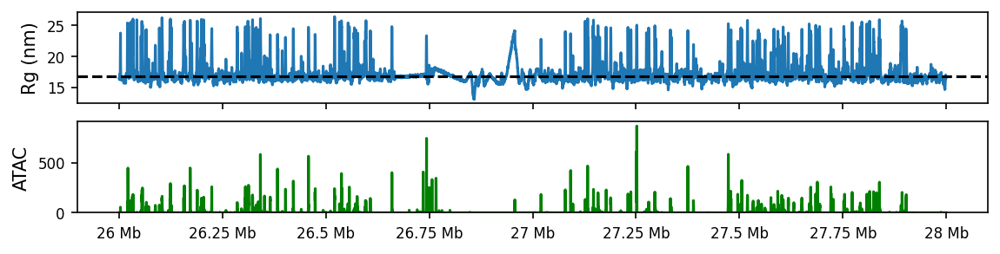

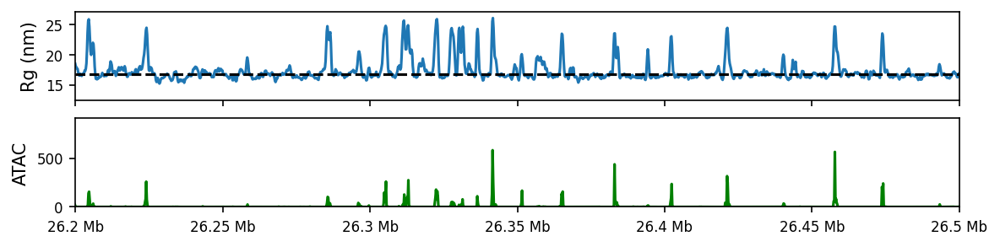

In [8]:
def get_atac(name):
    region = prod[name]['mei'].mei.config['region']
    chrom, start, end = parse_region(region)
    atac =  f'/orcd/data/binz/001/belong/for_revisions/genomics_data/HCT116/ENCFF624HRW.bigWig'
    atac = load_bw(atac, chrom, start, end)
    atac = bin_track(atac, step=200)
    return np.arange(start, end, 200), atac

name = 'region1'
for zoom in [False, True]:
    f, ax = plt.subplots(2, sharex=True, figsize=(9, 2))
    ax[0].plot(centers[name], medians[name])
    ax[0].axhline(np.median(medians[name]), color='k', ls='--')
    ax[0].set_ylabel('Rg (nm)')

    atac_x, atac_y = get_atac(name)
    ax[1].plot(atac_x, atac_y, c='green')
    ax[1].set_ylim(0, None)
    ax[1].set_ylabel('ATAC')

    format_ticks(ax[1], y=False, rotate=False)
    if zoom:
        ax[1].set_xlim(26.2e6, 26.5e6)
        plt.savefig('img/example_rg_v_atac.png')
    plt.show()

In [ ]:
for length in [10_000, 30_000, 100_000, 300_000]:
    centers, medians, lows, highs = get_rgs(length=length, p=10)
    plot_rgs(centers, medians, lows, highs)

/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


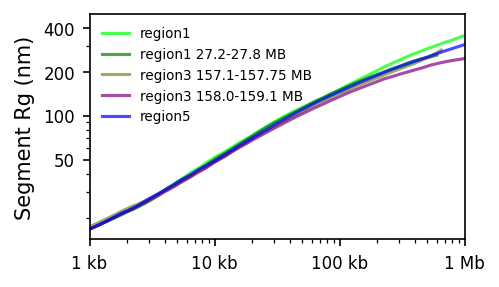

/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


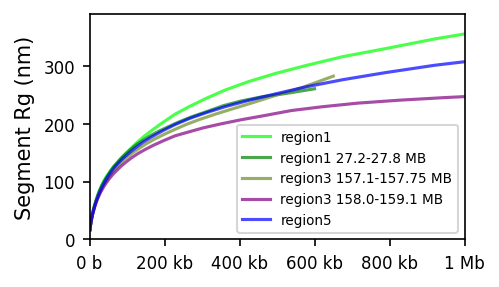

In [36]:
zooms = {
    'region1': ('region1', 26_000_000, 28_000_000, 'lime'),
    'region1 27.2-27.8 MB': ('region1', 27_200_000, 27_800_000, 'green'),
    'region3 157.1-157.75 MB': ('region3', 157_100_000, 157_750_000, 'olivedrab'),
    'region3 158.0-159.1 MB': ('region3', 158_000_000, 159_100_000, 'purple'),
    'region5': ('region5', 62_000_000, 64_000_000, 'blue'),
}

for log_scale in [True, False]:
    f, ax = fixed_panel_grid(1, 1, panel_width_in=2.5, panel_height_in=1.5,
                             left_in=0.6, top_in=0.25, bottom_in=0.25)
    ax = ax[0, 0]
    for zoom_name, (name, zoom_start, zoom_end, color) in zooms.items():
        domain = domains[name]
        chrom, start, end = parse_region(prod[name]['mei'].mei.config['region'])
        zoom_start_i = (zoom_start - start) // 200
        zoom_end_i = (zoom_end - start) // 200 + 1

        seps = np.unique(np.logspace(np.log10(5), np.log10(zoom_end_i - zoom_start_i - 1), 50).astype(int))
        dists = []
        for sep in seps:
            all_distances = []
            for d in domain:
                positions = d.positions[zoom_start_i:zoom_end_i]
                for start in range(0, len(positions)-sep, max(1, (len(positions)-sep) // 10)):
                    all_distances += [get_rg(positions[start:start+sep+1])]
            distances = np.array(all_distances)
            dists += [np.median(distances)]
        dists = np.array(dists)
        x = seps * 200

        ax.plot(x, dists, label=zoom_name, color=color, alpha=0.7)
    
    ax.set_ylabel('Segment Rg (nm)')

    if log_scale:
        ax.set_xlim(1e3, 1e6)
        ax.set_xscale('log')
        ax.set_yscale('log')
        ax.set_yticks([50, 100, 200, 400])
        ax.set_yticklabels([50, 100, 200, 400])
        ax.legend(loc='upper left', fontsize=6.5, frameon=False)
        format_ticks(ax, y=False, rotate=False)
        f.savefig('img/hct116_rgs_scaling.png', bbox_inches=f.bbox_inches, dpi=300)
    else:
        ax.set_xlim(0, 1e6)
        ax.set_ylim(0, 390)
        format_ticks(ax, y=False, rotate=False)
        ax.legend(loc='lower right', fontsize=6.5)
    plt.show()

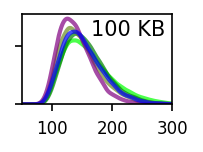

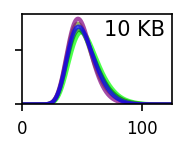

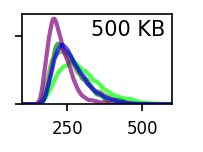

In [ ]:
from scipy.stats import gaussian_kde

def myhist(data, bins, ax=None, density=True, bw = 0.05, alpha=1, lw=1, n_points=1000, weights=None, **kwargs):
    p = plt if ax is None else ax
    if data.min() < bins[0] or data.max() > bins[-1]:
        print(f'Warning: data outside range ({data.min()} to {data.max()} vs {bins[0]} to {bins[-1]})')
    
    cov = np.cov(data, aweights=weights if weights is not None else None)
    kde = gaussian_kde(data, weights=weights, bw_method=bw / cov**0.5)
    y = kde(bins)
    p.plot(bins, y, lw=lw, alpha=alpha, **kwargs)

for sep, fname, bins in [(100_000 // 200, 'img/hct116_rgs_hist.png', np.linspace(50, 300, 1000)),
                         (10_000 // 200, None, np.linspace(0, 125, 1000)),
                         (500_000 // 200, 'img/hct116_rgs_hist_large.png', np.linspace(100, 600, 1000))]:
    f, ax = fixed_panel_grid(1, 1, panel_width_in=1.0, panel_height_in=0.6,
                             left_in=0.25, right_in=0.25, top_in=0.25, bottom_in=0.25)
    ax = ax[0, 0]
    for zoom_name, (name, zoom_start, zoom_end, color) in zooms.items():
        domain = domains[name]
        chrom, start, end = parse_region(prod[name]['mei'].mei.config['region'])
        zoom_start, zoom_end = zoom_start, zoom_end
        zoom_start_i = (zoom_start - start) // 200
        zoom_end_i = (zoom_end - start) // 200 + 1

        all_distances = []
        for d in domain:
            positions = d.positions[zoom_start_i:zoom_end_i]
            for start in range(0, len(positions)-sep, max(1, (len(positions)-sep) // 10)):
                all_distances += [get_rg(positions[start:start+sep+1])]
        all_distances = np.array(all_distances)
        myhist(all_distances, bins=bins, ax=ax, alpha=0.7, lw=2, color=color, bw=5)
    #ax.set_xlabel(f'{(sep*200) // 1000} KB segment Rg (nm)')
    ax.text(0.95, 0.95, f'{(sep*200) // 1000} KB', ha='right', va='top', transform=ax.transAxes)
    ax.set_ylim(0, None)
    ax.set_xlim(bins[0], bins[-1])
    ax.set_yticklabels([])
    if fname is not None:
        f.savefig(fname, bbox_inches=f.bbox_inches, dpi=300)
    plt.show()

# Insulation scores

In [5]:
for name, info in prod.items():
    root = os.path.dirname(info['config'])
    config = os.path.basename(info['config'])
    cmd = f'python -m maxentnuc.analysis.insulation --iteration {info["iteration"]} --skip 11 --config ./{config}'
    print(f'cd {root}; sbatch -J {name} -p mit_normal --mem=64G --time=12:00:00 --wrap="{cmd}"')

cd /orcd/data/binz/001/joepaggi/mei_runs/hct116/region1; sbatch -J region1 -p mit_normal --mem=64G --time=12:00:00 --wrap="python -m maxentnuc.analysis.insulation --iteration 19 --skip 11 --config ./config.yaml"
cd /orcd/data/binz/001/joepaggi/mei_runs/hct116/region3; sbatch -J region3 -p mit_normal --mem=64G --time=12:00:00 --wrap="python -m maxentnuc.analysis.insulation --iteration 28 --skip 11 --config ./config.yaml"
cd /orcd/data/binz/001/joepaggi/mei_runs/hct116/region5; sbatch -J region5 -p mit_normal --mem=64G --time=12:00:00 --wrap="python -m maxentnuc.analysis.insulation --iteration 14 --skip 11 --config ./config.yaml"


In [6]:
insulations = {}
for name in prod:
    fname = os.path.dirname(prod[name]['config']) + '/insulation.pkl'
    print(fname)
    with open(fname, 'rb') as f:
        ins = pickle.load(f)
        print(ins['params'])
        insulations[name] = ins['scores']

/orcd/data/binz/001/joepaggi/mei_runs/hct116/region1/insulation.pkl
{'radius': 40, 'ignore_diags': 2}
/orcd/data/binz/001/joepaggi/mei_runs/hct116/region3/insulation.pkl
{'radius': 40, 'ignore_diags': 2}
/orcd/data/binz/001/joepaggi/mei_runs/hct116/region5/insulation.pkl


{'radius': 40, 'ignore_diags': 2}


In [7]:
windows = [5, 10, 50, 500]

median_insulation = {5: np.float64(-0.4594316186372972),
 10: np.float64(-1.4706298252421612),
 50: np.float64(-4.4658011435130245),
 500: np.float64(-7.794560144799579)}

In [8]:
domains_ins = {}
for name, _domains in domains.items():
    print(name)
    insulation = insulations[name]
    mask = insulation[10] > median_insulation[10] - 1.0
    assert len(_domains) == len(mask), f'Number of domains ({len(_domains)}) does not match number of insulation masks ({len(mask)}) for {name}'

    domains_ins[name] = []
    for i in range(len(_domains)):
        positions = _domains[i].positions.copy()
        labels = get_segments(mask[i])
        domains_ins[name] += [Domains(positions, labels)]

region1
region3
region5


In [12]:
def get_loops(labels):
    loops = []
    loop_start = None
    for i in range(len(labels)):
        if labels[i] == -1:
            if loop_start is None:
                loop_start = i
        elif loop_start is not None:
            loops += [(loop_start, i)]
            loop_start = None
    return loops

# Insulation domains

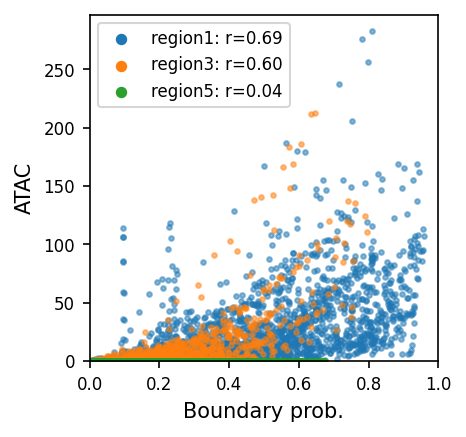

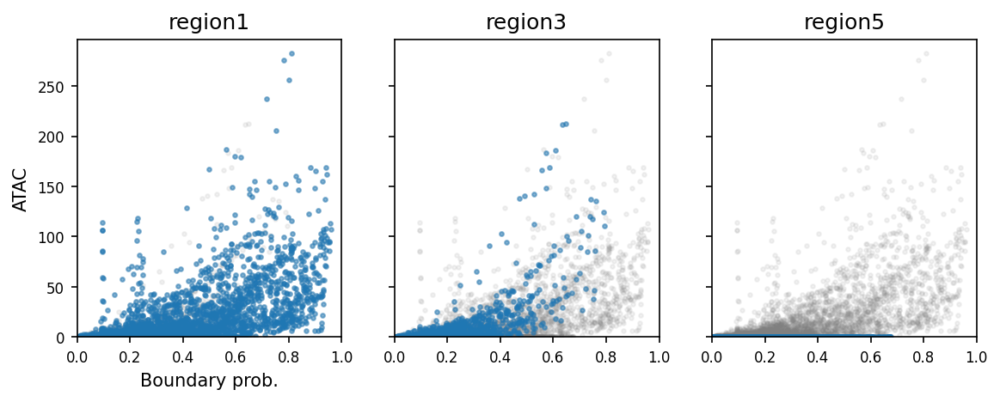

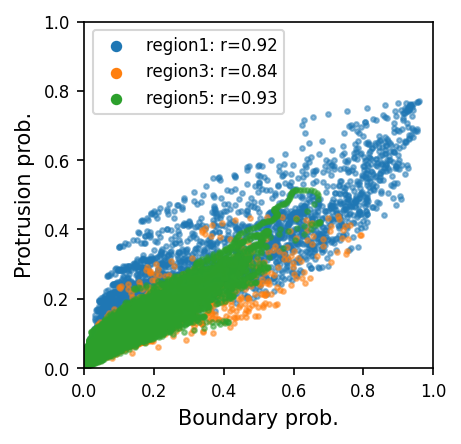

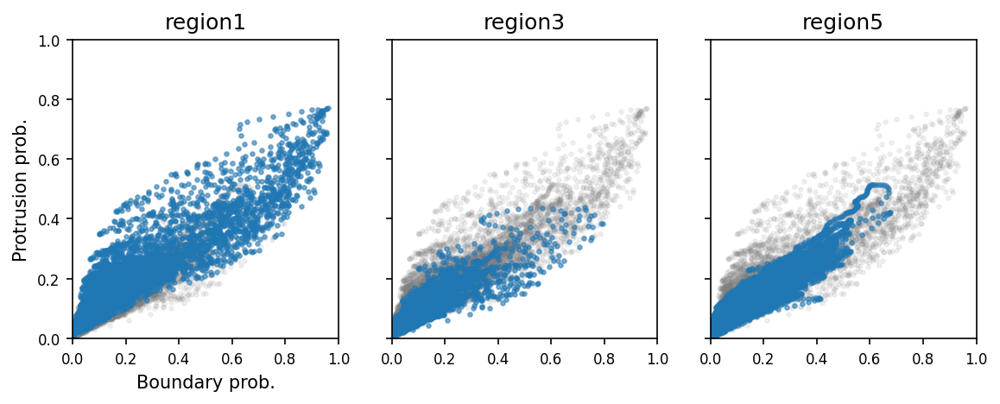

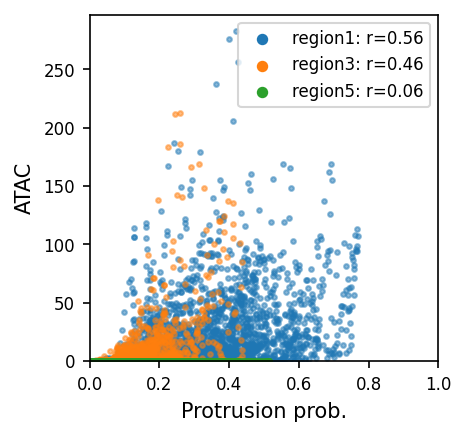

...

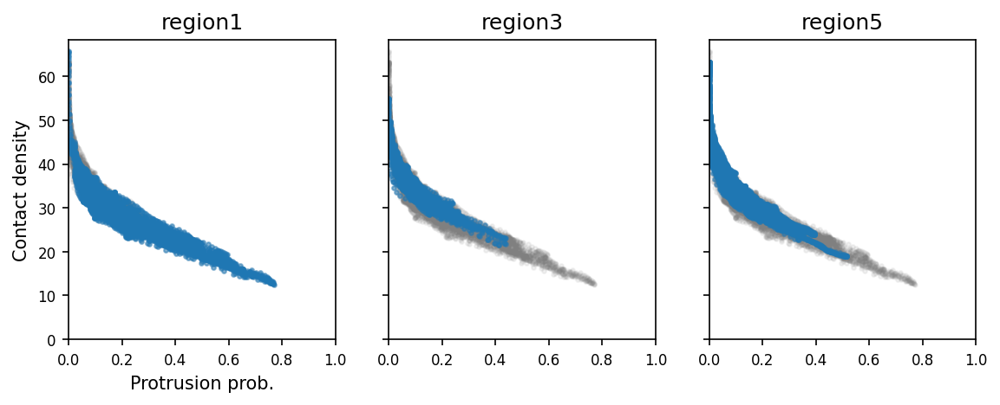

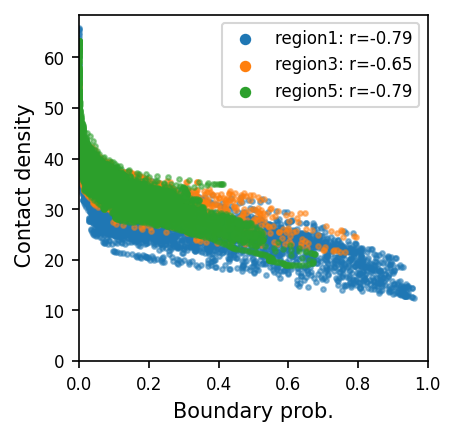

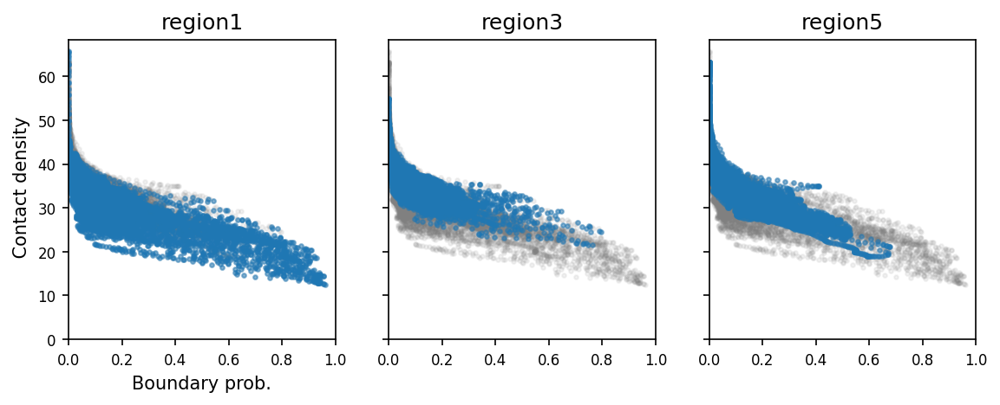

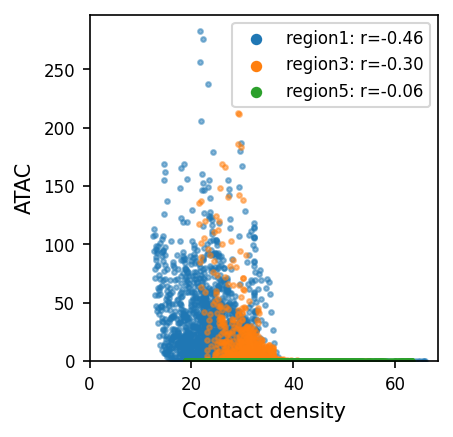

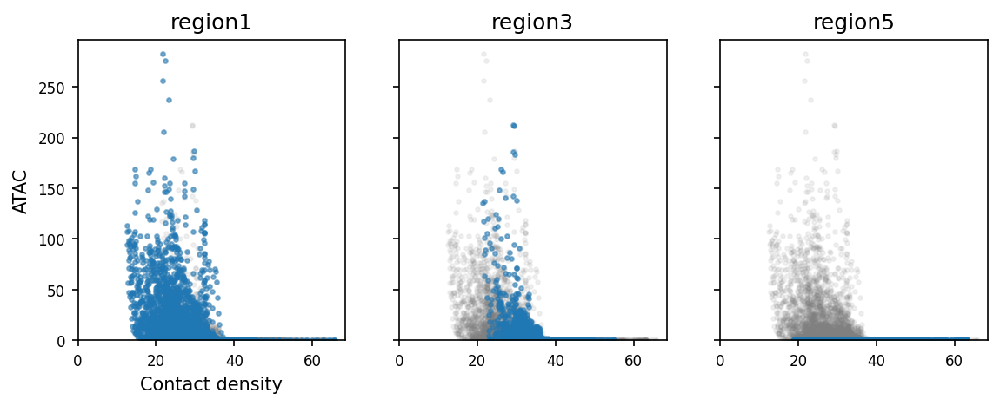

In [13]:
from scipy.stats import pearsonr
from neighbor_balance.ice import get_marginal

def get_atac(name):
    region = prod[name]['mei'].mei.config['region']
    chrom, start, end = parse_region(region)
    atac =  f'/orcd/data/binz/001/belong/for_revisions/genomics_data/HCT116/ENCFF624HRW.bigWig'
    atac = load_bw(atac, chrom, start, end)
    atac = bin_track(atac, step=200)
    return atac

def get_protrusions(name):
    return np.mean([d.labels == -1 for d in domains[name]], axis=0)

def get_insulation_boundaries(name):
    return np.mean([d.labels == -1 for d in domains_ins[name]], axis=0)

def get_density(name):
    ref_map = prod[name]['mei'].get_reference_contact_map()
    return 2*get_marginal(ref_map)


def process(track):
    buf = 50_000 // 200
    bw = 2.5
    return gaussian_filter1d(track, bw)[buf:-buf]

def scatter_metrics_together(metric1_name, metric2_name, metric1, metric2):
    f, ax = plt.subplots(figsize=(3, 3))
    for name in main_names:
        feature1 = metric1(name)
        feature2 = metric2(name)
    
        feature1 = process(feature1)
        feature2 = process(feature2)
    
        r, _ = pearsonr(feature1, feature2)
        sc = ax.scatter(feature1, feature2, alpha=0.5, s=5)
        ax.scatter([], [], color=sc.get_facecolor()[0], s=20, label=f'{stylized_names[name]}: r={r:.2f}', alpha=1)

    ax.legend()
    if 'prob' in metric1_name:
        ax.set_xlim(0, 1)
    else:
        ax.set_xlim(0)
    if 'prob' in metric2_name:
        ax.set_ylim(0, 1)
    else:
        ax.set_ylim(0)
    ax.set_xlabel(metric1_name)
    ax.set_ylabel(metric2_name)
    return ax

def scatter_metrics_separate(metric1_name, metric2_name, metric1, metric2):
    f, axs = plt.subplots(1, len(main_names), figsize=(3*len(main_names), 3), sharex=True, sharey=True)
    for name in main_names:
        feature1 = metric1(name)
        feature2 = metric2(name)

        feature1 = process(feature1)
        feature2 = process(feature2)
        for ax in axs:
            ax.scatter(feature1, feature2, alpha=0.1, s=5, color='gray')

    for i, name in enumerate(main_names):
        feature1 = metric1(name)
        feature2 = metric2(name)
    
        feature1 = process(feature1)
        feature2 = process(feature2)
    
        r, _ = pearsonr(feature1, feature2)
        sc = axs[i].scatter(feature1, feature2, alpha=0.5, s=5)
        axs[i].set_title(stylized_names[name])

    if 'prob' in metric1_name:
        axs[0].set_xlim(0, 1)
    else:
        axs[0].set_xlim(0)
    if 'prob' in metric2_name:
        axs[0].set_ylim(0, 1)
    else:
        axs[0].set_ylim(0)
    
    axs[0].set_xlabel(metric1_name)
    axs[0].set_ylabel(metric2_name)


def scatter_metrics(metric1_name, metric2_name, metric1, metric2):
    ax = scatter_metrics_together(metric1_name, metric2_name, metric1, metric2)
    
    plt.savefig(f'img/scatter_together_{metric1_name}_{metric2_name}.pdf')
    plt.show()

    scatter_metrics_separate(metric1_name, metric2_name, metric1, metric2)
    plt.savefig(f'img/scatter_separate_{metric1_name}_{metric2_name}.pdf')
    plt.show()

scatter_metrics('Boundary prob.', 'ATAC', get_insulation_boundaries,  get_atac)
scatter_metrics('Boundary prob.', 'Protrusion prob.', get_insulation_boundaries, get_protrusions)
scatter_metrics('Protrusion prob.', 'ATAC', get_protrusions, get_atac)
scatter_metrics('Protrusion prob.', 'Contact density', get_protrusions, get_density)
scatter_metrics('Boundary prob.', ' Contact density', get_insulation_boundaries, get_density)
scatter_metrics('Contact density', 'ATAC', get_density, get_atac)

region1
Protrusion prob: 0.161, Boundary prob: 0.171, ATAC: 5.718


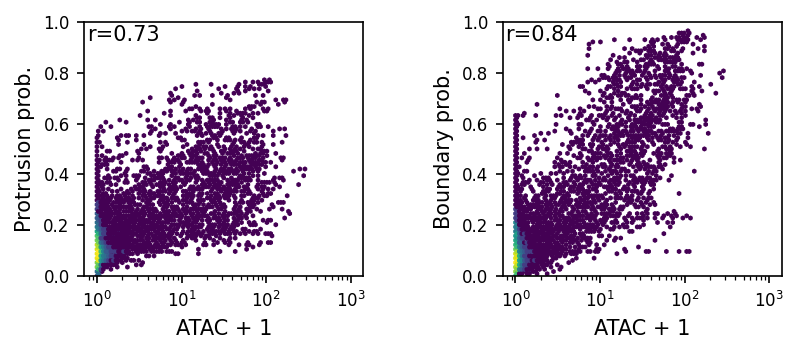

region3
Protrusion prob: 0.090, Boundary prob: 0.113, ATAC: 1.297


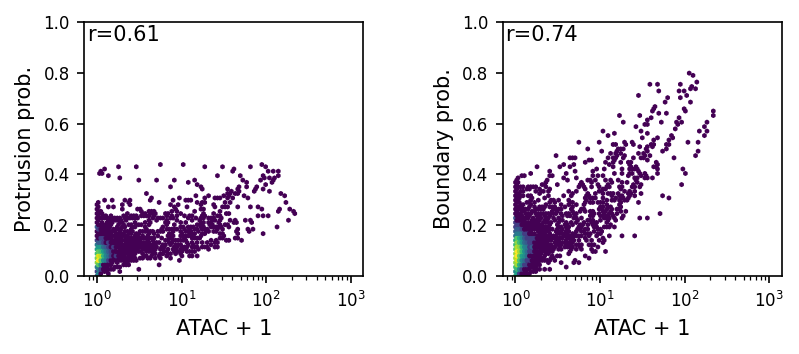

region5
Protrusion prob: 0.129, Boundary prob: 0.154, ATAC: 0.004


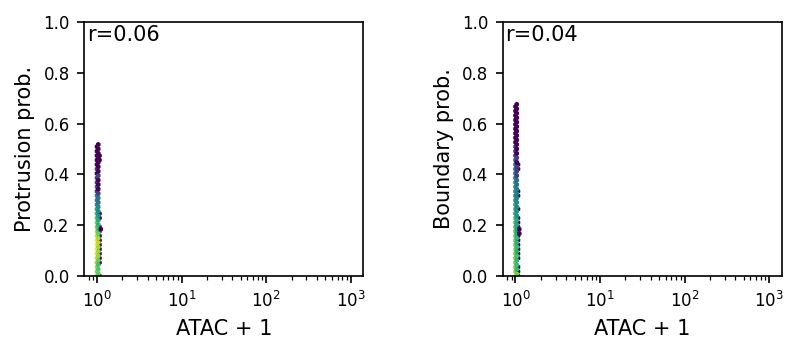

In [14]:
def scatter_individual(name):
    atac = process(get_atac(name))
    protrusions = process(get_protrusions(name))
    boundaries = process(get_insulation_boundaries(name))
    print(f'Protrusion prob: {protrusions.mean():.3f}, Boundary prob: {boundaries.mean():.3f}, ATAC: {atac.mean():.3f}')

    f, ax = plt.subplots(1, 2, figsize=(6, 2.2), gridspec_kw={'wspace': 0.5})
    ax[0].hexbin(1 + atac, protrusions, norm=LogNorm(), extent=(0, 3, 0, 1), bins=50, xscale='log')
    ax[0].text(0.01, 0.99, f'r={pearsonr(protrusions, np.log(1 + atac))[0]:.2f}', transform=ax[0].transAxes, ha='left', va='top')
    ax[0].set_ylim(0, 1)
    ax[0].set_ylabel('Protrusion prob.')
    ax[0].set_xlabel('ATAC + 1')
    #ax[0].set_aspect('equal')

    ax[1].hexbin(1 + atac, boundaries, norm=LogNorm(), extent=(0, 3, 0, 1), bins=50, xscale='log')
    ax[1].text(0.01, 0.99, f'r={pearsonr(boundaries, np.log(1 + atac))[0]:.2f}', transform=ax[1].transAxes, ha='left', va='top')
    ax[1].set_ylim(0, 1)
    #ax[1].set_xlim(1e0, 1e3)
    ax[1].set_ylabel('Boundary prob.')
    ax[1].set_xlabel('ATAC + 1')
    
    plt.savefig(f'img/microdomains_corr_{name}.pdf')
    plt.show()

for name in prod:
    print(name)
    scatter_individual(name)

# Plots for full regions

In [15]:
import cooler
import bioframe
import cooltools

def compute_compartments(cool, fasta, chrom, res):
    clr = cooler.Cooler(f'{cool}::/resolutions/{res}')
    start = 0
    end = clr.chromsizes[chrom]
    bins = clr.bins()[:]
    bins = bins.loc[bins.chrom == chrom]
    genome = bioframe.load_fasta(fasta)
    gc_cov = bioframe.frac_gc(bins[['chrom', 'start', 'end']], genome)
    cis_eigs = cooltools.eigs_cis(clr, phasing_track=gc_cov, view_df=pd.DataFrame({'chrom': [chrom], 'start': [start], 'end': [end], 'name': [chrom]}), n_eigs=1)
    return np.arange(start, end, res), cis_eigs[1]['E1']

def plot_compartments(ab_x, ab, ax):
    ax.fill_between(ab_x, 0, np.maximum(0, ab), color='green', edgecolor='none')
    ax.fill_between(ab_x, 0, np.minimum(0, ab), color='red', edgecolor='none')

In [16]:
# root = '/home/joepaggi/share'
# cool = f'{root}/microc/hsieh/GSE130275_mESC_WT/GSE130275_mESC_WT_minus_inward.mcool'
# fasta = f'{root}/ucsc/mm39.fa'
# compartments = {}
# for name in domains:
#     print(name)
#     region = prod[name]['mei'].mei.config['region']
#     chrom, start, end = parse_region(region)
#     compartments[chrom] = compute_compartments(cool, fasta, chrom, 12_800)

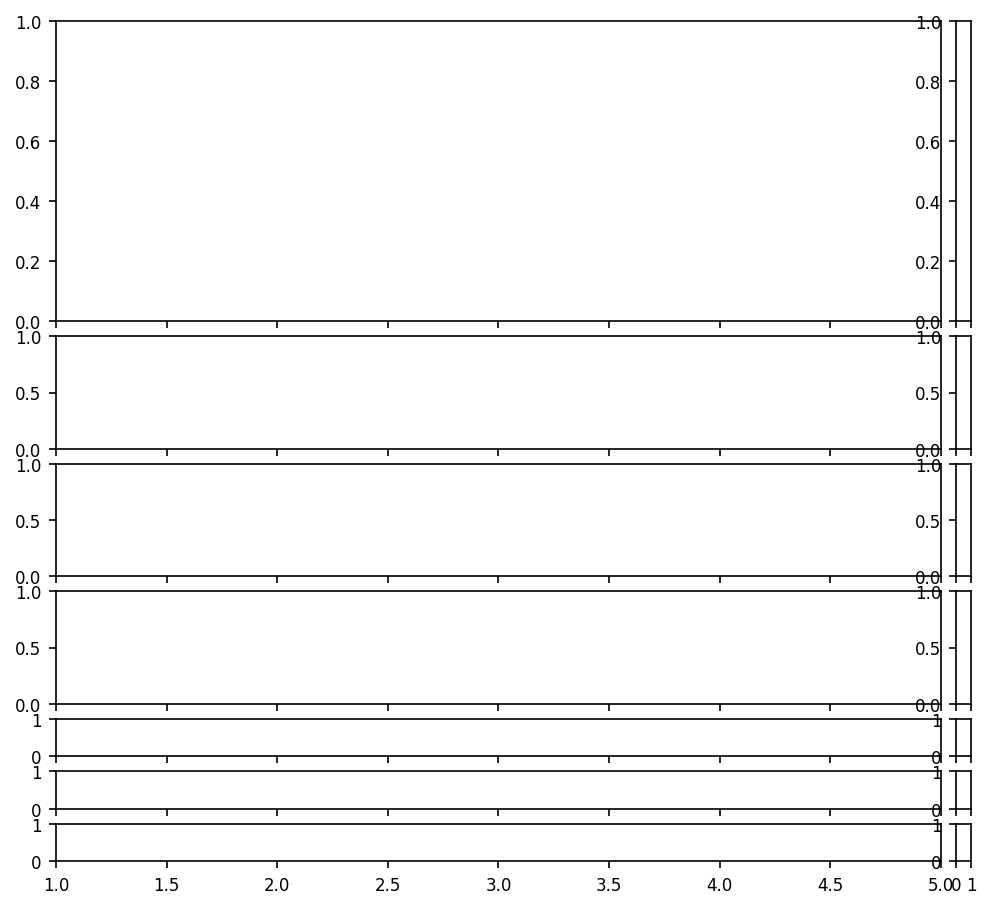

In [17]:
def fixed_panel_grid(
    nrows,
    ncols,
    panel_width_in=3.0,
    panel_height_in=3.0,
    hspace_in=0.5,
    vspace_in=0.5,
    left_in=0.75,
    right_in=0.25,
    bottom_in=0.75,
    top_in=0.5,
):
    """
    Create a figure with nrows x ncols axes, each with a fixed physical size.

    panel_width_in:
        float or sequence of length ncols
    panel_height_in:
        float or sequence of length nrows
    All spacing and margins are specified in inches.
    """

    # Normalize widths/heights to arrays
    if np.isscalar(panel_width_in):
        panel_widths = np.full(ncols, panel_width_in, dtype=float)
    else:
        panel_widths = np.asarray(panel_width_in, dtype=float)
        if len(panel_widths) != ncols:
            raise ValueError("panel_width_in must have length ncols")

    if np.isscalar(panel_height_in):
        panel_heights = np.full(nrows, panel_height_in, dtype=float)
    else:
        panel_heights = np.asarray(panel_height_in, dtype=float)
        if len(panel_heights) != nrows:
            raise ValueError("panel_height_in must have length nrows")

    # Total figure size in inches
    fig_width = (
        left_in
        + panel_widths.sum()
        + hspace_in * (ncols - 1)
        + right_in
    )

    fig_height = (
        bottom_in
        + panel_heights.sum()
        + vspace_in * (nrows - 1)
        + top_in
    )

    fig = plt.figure(figsize=(fig_width, fig_height))
    axes = np.empty((nrows, ncols), dtype=object)

    # Precompute cumulative offsets
    x_offsets = []
    for c in range(ncols):
        if c == 0:
            x_offsets.append(left_in)
        else:
            x_offsets.append(x_offsets[-1] + panel_widths[c - 1] + hspace_in)
    y_offsets = []
    for r in range(nrows):
        y_offsets.append(bottom_in + (nrows - r - 1)* vspace_in + panel_heights[r+1:].sum())

    for r in range(nrows):
        for c in range(ncols):
            left = x_offsets[c] / fig_width
            bottom = y_offsets[r] / fig_height
            width = panel_widths[c] / fig_width
            height = panel_heights[r] / fig_height

            ax = fig.add_axes([left, bottom, width, height])
            axes[r, c] = ax

    return fig, axes

def share_x_by_column(axes):
    """
    Share the x-axis among rows within each column.
    axes: 2D array-like of Axes [nrows, ncols]
    """
    nrows, ncols = axes.shape

    for c in range(ncols):
        base = axes[0, c]
        for r in range(1, nrows):
            axes[r, c].sharex(base)

        # Hide x tick labels on all but bottom row
        for r in range(nrows - 1):
            axes[r, c].tick_params(labelbottom=False)

f, ax = fixed_panel_grid(1 + 3 + 3, 2,
                         panel_width_in=[5.9, 0.1],
                         panel_height_in=[2] + [0.75]*3 + [0.25]*3,
                         hspace_in=0.1, vspace_in=0.1)
ax[0, 0].set_xlim(1, 5)
ax[1, 0].set_xlim(2, 6)
share_x_by_column(ax)

region1


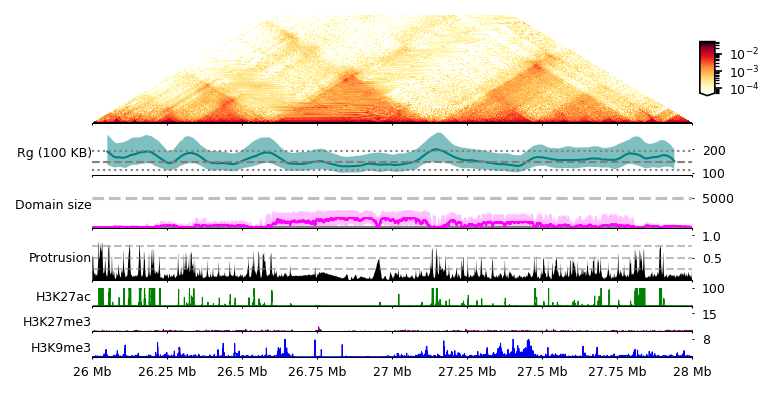

region3


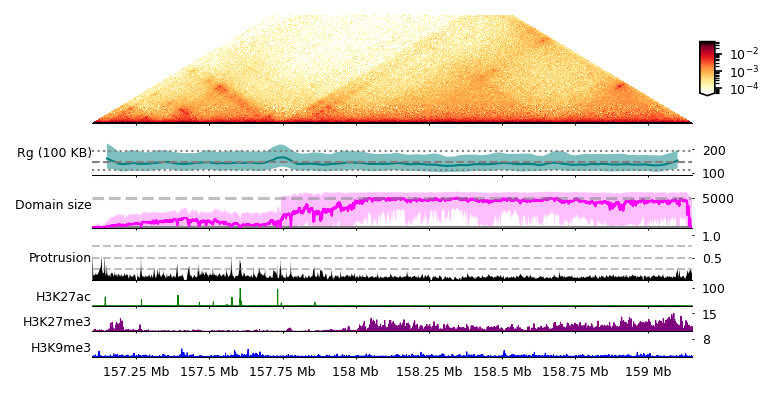

region5


In [ ]:
from neighbor_balance.plotting import get_epigenetics

def get_sizes(labels):
    sizes = np.ones(labels.shape)
    for t, label in enumerate(labels):
        for i in np.unique(labels):
            if i < 0:
                continue
            mask = label == i
            sizes[t, mask] = np.sum(mask)
    return sizes

def ylabel(ax, text):
    ax.text(-0.001, 0.5, text, transform=ax.transAxes, ha='right', va='center', size=6)

centers, medians, lows, highs = get_rgs(length=100_000, p=10)

for name in domains:
    print(name)
    region = prod[name]['mei'].mei.config['region']
    chrom, start, end = parse_region(region)
    ref_map = prod[name]['mei'].get_reference_contact_map()

    w = 250
    vmin = 5e-5
    vmax = 5e-2


    tracks = {
        'A/B': '4DNFIUDME6HK.bw',
        'H3K4me3': 'ENCFF983JLZ.bigWig',
        'H3K27ac': 'ENCFF758DHJ.bigWig',
        'ATAC': 'ENCFF624HRW.bigWig',
        'RNA': 'ENCFF048EJE.bigWig',
        'H3K27me3': 'ENCFF232QSG.bigWig',
        'H3K9me3': 'ENCFF020CHJ.bigWig',
    }
    root = '/orcd/data/binz/001/belong/for_revisions/genomics_data'
    condition = 'HCT116'
    tracks = {k: f'{root}/{condition}/{tracks[k]}' for k in tracks}

    w = 4
    depth_fraction = 0.6
    cmap_aspect = 0.6
    h = depth_fraction * w / 2 * cmap_aspect
    f, ax = fixed_panel_grid(1 + 3 + 3, 2,
                         panel_width_in=[w, 0.1],
                         panel_height_in=[h] + [0.3]*3 + [0.12]*3,
                         left_in=0.5, right_in=0.5,
                         hspace_in=0.05, vspace_in=0.05)
    share_x_by_column(ax)

    x = np.arange(start, end, 200)

    # Show the contact map.
    contact_map = ContactMap(ref_map, chrom=chrom, start=start, end=end, resolution=200)
    im = contact_map.plot_contact_map_horizontal(depth=(end-start)*0.6, vmin=vmin, vmax=vmax, ax=ax[0, 0], colorbar=False)
    ax[0, 0].set_aspect(cmap_aspect / 2)
    plt.colorbar(im, cax=ax[0, 1], extend='min')
    pos = ax[0, 1].get_position()
    shrink = 1/2
    ax[0, 1].set_position([pos.x0, pos.y0 + pos.height * (1 - shrink) / 2, pos.width, pos.height*shrink])
    ax[0, 0].set_yticks([])

    i = 1
    # Rg.
    ylabel(ax[i, 0], 'Rg (100 KB)')
    ax[i, 0].plot(centers[name], medians[name], color='teal', lw=1)
    ax[i, 0].fill_between(centers[name], lows[name], highs[name], facecolor='teal', edgecolor=None, alpha=0.5)
    ax[i, 0].axhline(np.median(np.concatenate([medians[r] for r in main_names])), color='gray', ls='--', lw=1)
    ax[i, 0].axhline(np.median(np.concatenate([lows[r] for r in main_names])), color='gray', ls=':', lw=1)
    ax[i, 0].axhline(np.median(np.concatenate([highs[r] for r in main_names])), color='gray', ls=':', lw=1)
    ax[i, 0].set_ylim(np.min(np.concatenate([lows[r] for r in main_names]))-10,
                      np.max(np.concatenate([highs[r] for r in main_names]))+10)
    i += 1

    # Domain sizes.
    packing = np.array([d.labels for d in domains[name]])
    sizes = get_sizes(packing[::10])
    low = np.percentile(sizes, 25, axis=0)
    mid = np.percentile(sizes, 50, axis=0)
    high = np.percentile(sizes, 75, axis=0)
    ylabel(ax[i, 0], 'Domain size')
    ax[i, 0].axhline(50, c='gray')
    ax[i, 0].fill_between(np.arange(start, end, 200), low, high, facecolor='magenta', alpha=0.25)
    ax[i, 0].plot(np.arange(start, end, 200), mid, lw=1, c='magenta')
    ax[i, 0].set_ylim(0, 7500)
    ax[i, 0].set_yticks([5000])
    ax[i, 0].axhline(5000, c='gray', ls='--', alpha=0.5)
    i += 1

    # Normal loop prob.
    ylabel(ax[i, 0], 'Protrusion')
    p_loop = np.mean([d.labels == -1 for d in domains[name]], axis=0)
    ax[i, 0].fill_between(np.arange(start, end, 200), 0, p_loop, facecolor='black', edgecolor='none')
    ax[i, 0].set_ylim(0, 1)
    ax[i, 0].set_yticks([0.5, 1])
    for y in [0.25, 0.5, 0.75]:
        ax[i, 0].axhline(y, c='gray', ls='--', alpha=0.5, lw=1)
    i += 1

    # Epigenetics
    for track_name, max_val, color in [('H3K27ac', 100, 'g'), ('H3K27me3', 15, 'purple'), ('H3K9me3', 8, 'b')]:
        x, values = get_epigenetics(tracks[track_name], chrom, start, end, bin=True)
        ylabel(ax[i, 0], track_name)
        ax[i, 0].fill_between(x, 0, values, color=color, lw=0.5)
        ax[i, 0].set_ylim(0, max_val)
        ax[i, 0].set_yticks([max_val])
        i += 1
    
    # A/B
    # x, values = get_epigenetics(tracks['A/B'], chrom, start, end, bin=True)
    # ax[i, 0].text(0.01, 0.99, 'A/B', transform=ax[i, 0].transAxes, ha='left', va='top')
    # ax[i, 0].fill_between(x, 0, values, where=values>0, color='green', lw=0.5)
    # ax[i, 0].fill_between(x, 0, values, where=values<0, color='red', lw=0.5)
    # ax[i, 0].set_ylim(-1.75, 1.75)
    # ax[i, 0].set_yticks([-1, 1], ['-1', '+1'])
    # ax[i, 0].spines[['top', 'left', 'right']].set_visible(False)
    # ax[i, 0].spines['bottom'].set_position('center')
    # i += 1

    # Clean up axes
    format_ticks(ax[-1, 0], y=False, rotate=False)
    ax[0, 0].set_xlim(start, end)
    for i in range(len(ax)):
        if i > 0:
            ax[i, 1].axis('off')
        else:
            ax[i, 1].tick_params(axis='both', which='major', labelsize=6)
        ax[i, 0].yaxis.tick_right()
        ax[i, 0].tick_params(width=0.5, length=1)
        ax[i, 0].spines[['top', 'left', 'right']].set_visible(False)
        ax[i, 0].spines['bottom'].set_linewidth(0.5)
        ax[i, 0].tick_params(axis='both', which='major', labelsize=6)
    plt.savefig(f'img/insulation_{name}.pdf', bbox_inches=f.bbox_inches)
    plt.show()

region1


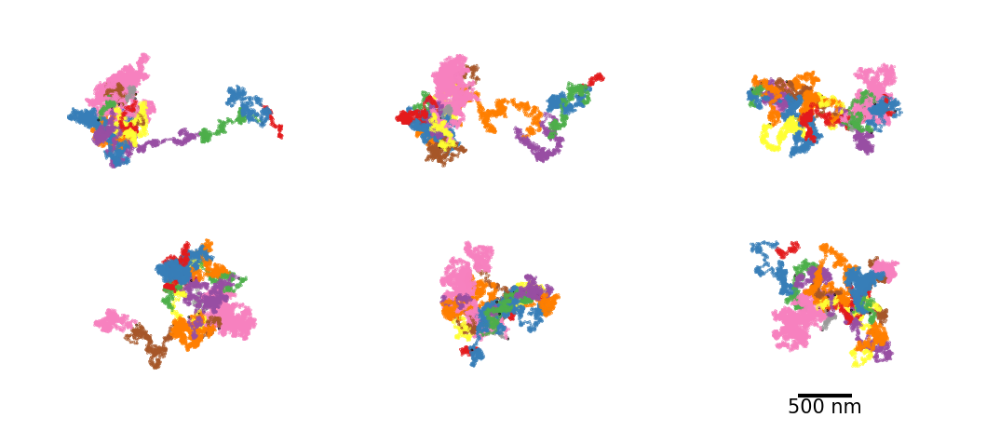

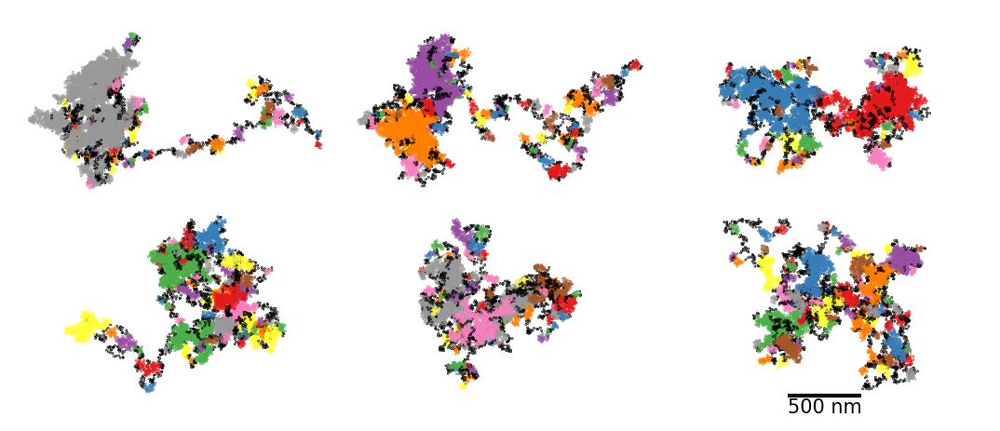

region3


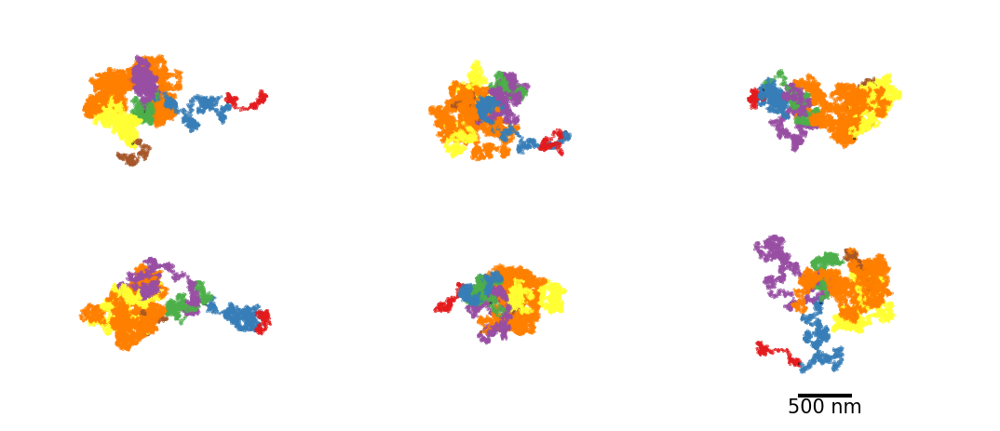

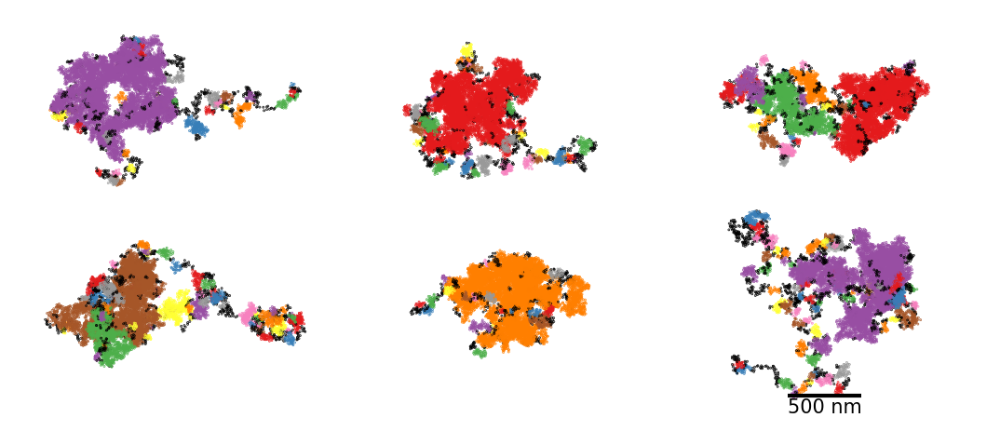

region5


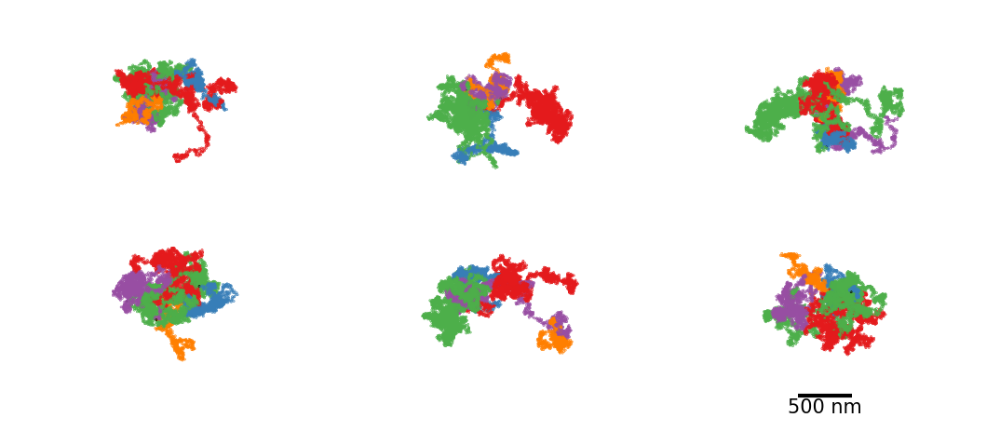

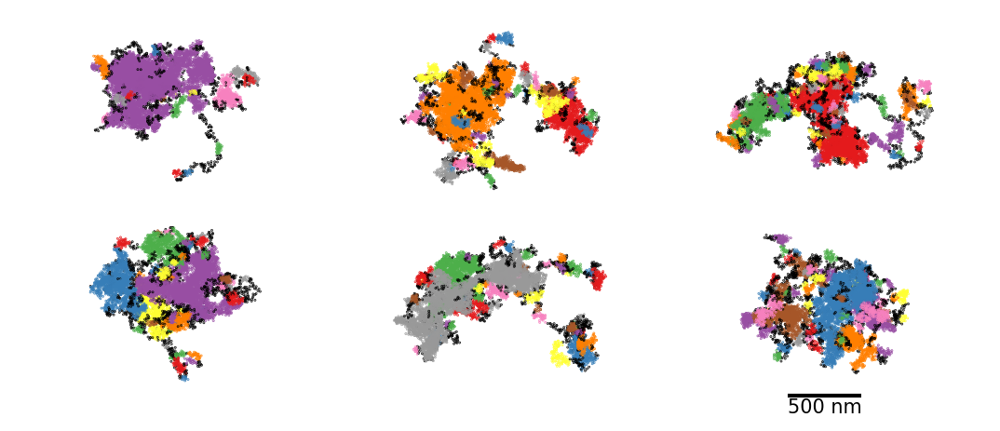

In [ ]:
for name in domains:
    print(name)
    region = prod[name]['mei'].mei.config['region']
    chrom, start, end = parse_region(region)
    ref_map = prod[name]['mei'].get_reference_contact_map()

    w = 250
    vmin = 5e-5
    vmax = 5e-2
    examples = 6

    ref_insulation_scores = np.log2(_insul_diamond_dense(ref_map, window=w, norm_by_median=False))
    boundaries = get_boundaries(mask_insulation_scores(ref_insulation_scores[None, :]), threshold=0.5)
    sections = get_sections(len(ref_insulation_scores), boundaries)[0]
    for b in boundaries[0]:
        sections[b] = -1

    dbscan = domains[name][::len(domains[name])//examples][:examples]
    refs = []
    
    for domain in dbscan:
        refs += [Domains(domain.positions, sections.astype(int))]

    plot_gallery_list(refs, lambda x, ax: x.plot_2D(ax=ax, colorbar=False, s=0.1, alpha=1), scalebar=500, size=1500, rows=2)
    plt.savefig(f'img/gallery_{name}.pdf')
    plt.show()
    
    plot_gallery_list(dbscan, lambda x, ax: x.plot_2D(ax=ax, colorbar=False, s=0.1, alpha=1), scalebar=500, size=1100, rows=2)
    plt.savefig(f'img/gallery_dbscan_{name}.pdf')
    plt.show()

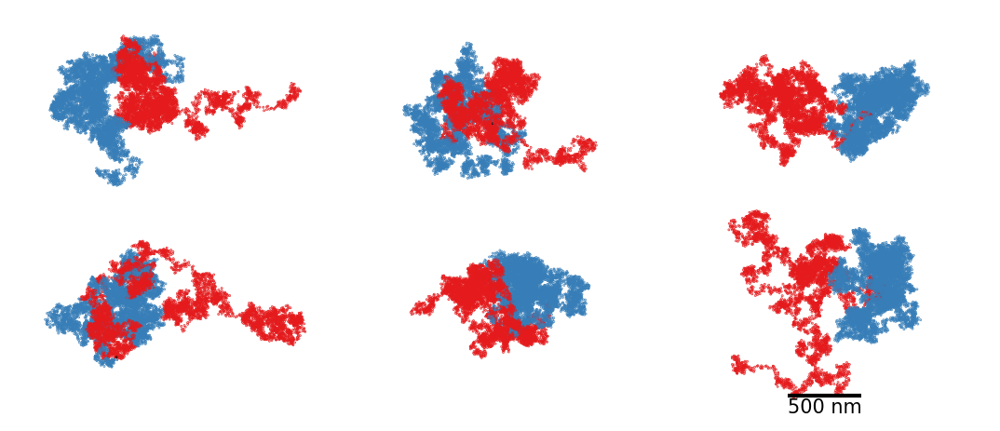

In [6]:
name = 'region3'

region = prod[name]['mei'].mei.config['region']
chrom, start, end = parse_region(region)
examples = 6

dbscan = domains[name][::len(domains[name])//examples][:examples]

boundaries = [[(158_000_000-start)//200]]
sections = get_sections(len(dbscan[0].positions), boundaries)[0]
for b in boundaries[0]:
    sections[b] = -1

refs = []
for domain in dbscan:
    refs += [Domains(domain.positions, sections.astype(int))]

plot_gallery_list(refs, lambda x, ax: x.plot_2D(ax=ax, colorbar=False, s=0.1, alpha=1), scalebar=500, size=1100, rows=2)
plt.savefig('img/hct116_region3_sections.pdf')
plt.show()

# DBSCAN domains are stochastic

region1


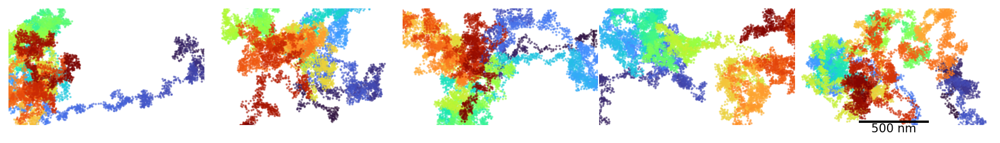

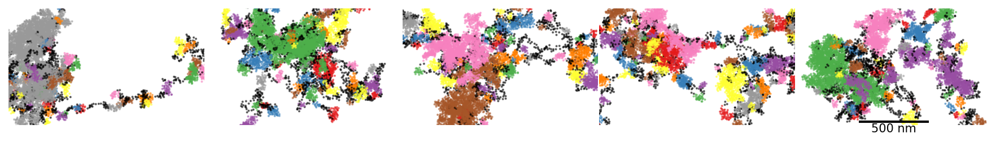

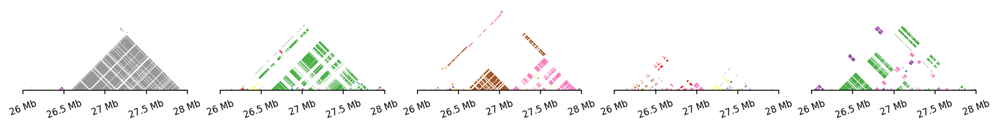

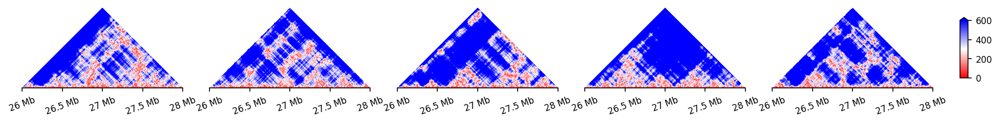

region3


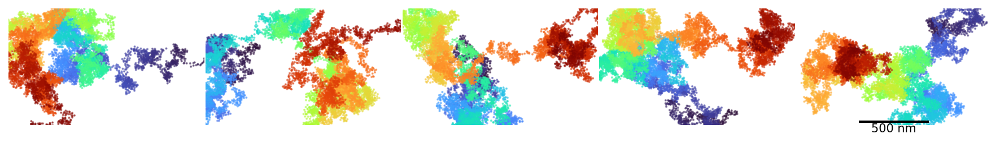

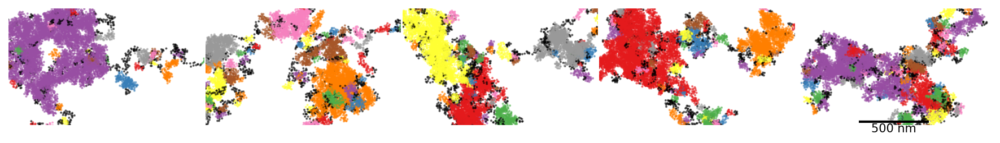

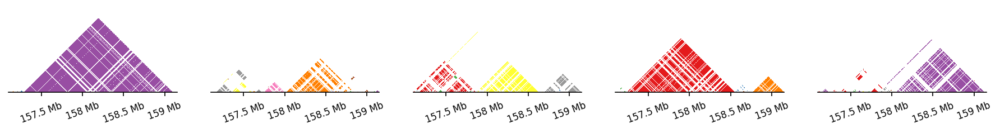

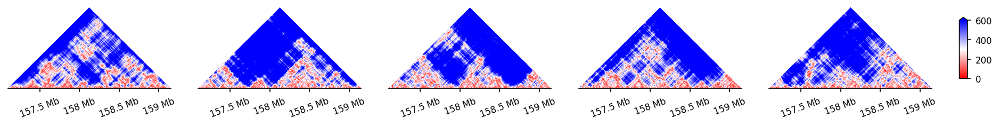

region5


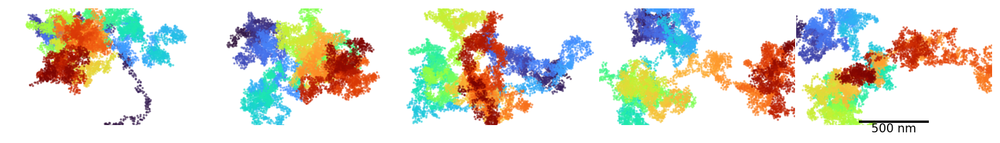

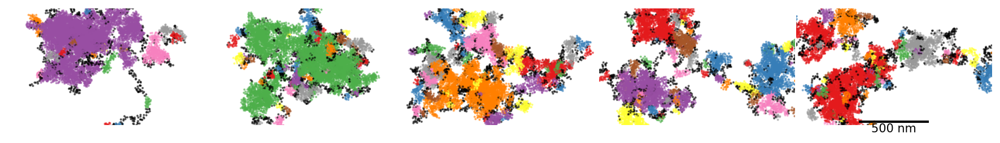

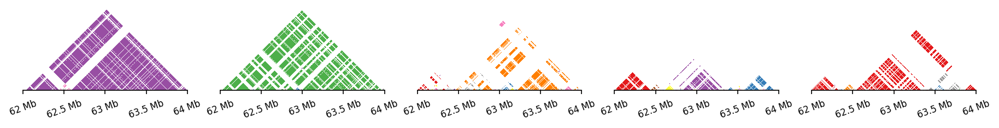

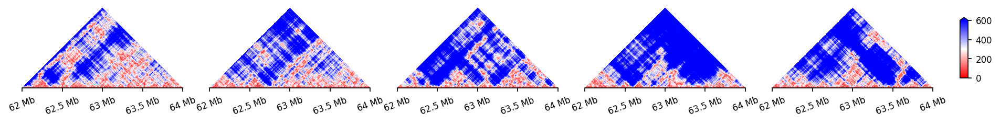

In [ ]:
def coarse_grain_map(x, factor=4, average=np.median):
    n = x.shape[0]
    n_cut = factor * (n // factor)
    x = x[:n_cut, :n_cut]
    return average(x.reshape(n_cut // factor, factor, n_cut // factor, factor), axis=(1, 3))

for name in domains:
    print(name)
    region = prod[name]['mei'].mei.config['region']
    chrom, start, end = parse_region(region)
    ref_map = prod[name]['mei'].get_reference_contact_map()

    w = 250
    vmin = 5e-4
    vmax = 1e-1
    examples = 5

    ref_insulation_scores = np.log2(_insul_diamond_dense(ref_map, window=w, norm_by_median=False))
    boundaries = get_boundaries(mask_insulation_scores(ref_insulation_scores[None, :]), threshold=0.5)
    sections = get_sections(len(ref_insulation_scores), boundaries)[0]
    for b in boundaries[0]:
        sections[b] = -1

    dbscan = domains[name][::len(domains[name])//examples][:examples]
    refs = []
    
    for domain in dbscan:
        refs += [Domains(domain.positions, sections.astype(int))]

    plot_gallery_list(dbscan, lambda x, ax: x.plot_chain_2D(ax=ax, colorbar=False, s=1, alpha=0.5), scalebar=500, size=700, rows=1)
    plt.savefig(f'img/stochastic_gallery_chain_{name}.pdf', )
    plt.show()
        
    plot_gallery_list(dbscan, lambda x, ax: x.plot_2D(ax=ax, colorbar=False, s=1, alpha=0.5), scalebar=500, size=700, rows=1)
    plt.savefig(f'img/stochastic_gallery_dbscan_{name}.pdf')
    plt.show()

    f, axs = plt.subplots(1, examples, figsize=(3*examples, 2), sharex=True, sharey=True)
    axs = axs.flatten()
    for ax, domain in zip(axs, dbscan):
        color = np.stack([domain.labels]*domain.positions.shape[0], axis=0)
        same = domain.labels[:, None] == domain.labels[None, :]
        color[~same] = -1
        factor = 5
        color = coarse_grain_map(color, factor=factor)
        contact_map = ContactMap(color, chrom=chrom, start=start, end=end, resolution=200*factor)
        contact_map.plot_contact_map_horizontal(cmap=domain.colors(noise_color='white'), ax=ax, colorbar=False, vmin=None, vmax=None, log_norm=False)
        ax.spines[['top', 'left', 'right']].set_visible(False)
        ax.set_yticks([])

        #plt.colorbar(im)
    plt.savefig(f'img/stochastic_dbscan_{name}.pdf')
    plt.show()
    
    f, axs = plt.subplots(1, examples+1, figsize=(3*examples+0.5, 2),
                         gridspec_kw={'width_ratios': [1]*examples + [0.05]})
    axs = axs.flatten()
    for ax, domain in zip(axs, dbscan):
        dists = get_distance_matrix(domain.positions)
        factor = 5
        dists = coarse_grain_map(dists, factor=factor)
        contact_map = ContactMap(dists, chrom=chrom, start=start, end=end, resolution=200*factor)
        im = contact_map.plot_contact_map_horizontal(cmap='bwr_r', vmin=0, vmax=600, colorbar=False, log_norm=False, ax=ax)
        ax.spines[['top', 'left', 'right']].set_visible(False)
        ax.set_yticks([])

    cax = axs[-1]
    plt.colorbar(im, cax=cax, extend='max')
    pos = cax.get_position()
    shrink = 1/2
    cax.set_position([pos.x0, pos.y0 + pos.height * (1 - shrink) / 2, pos.width, pos.height*shrink])
    plt.savefig(f'img/stochastic_dists_{name}.pdf')
    plt.show()

region1


100%|██████████| 1600/1600 [00:53<00:00, 29.78it/s]


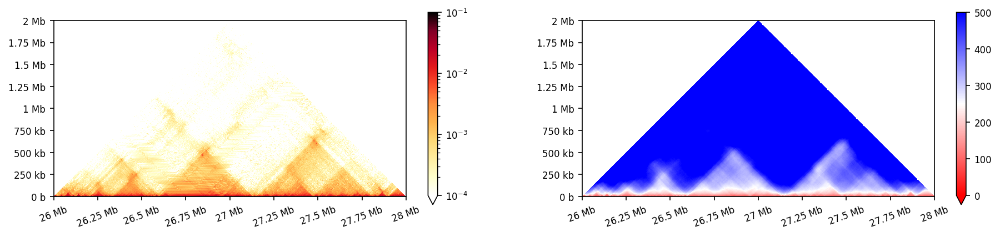

region3


100%|██████████| 1600/1600 [00:55<00:00, 28.62it/s]


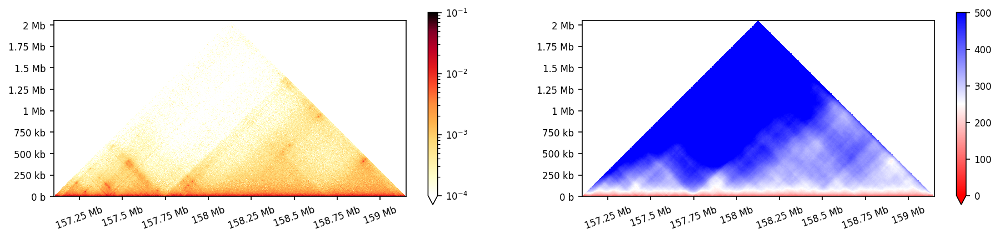

region5


100%|██████████| 1600/1600 [00:53<00:00, 29.76it/s]


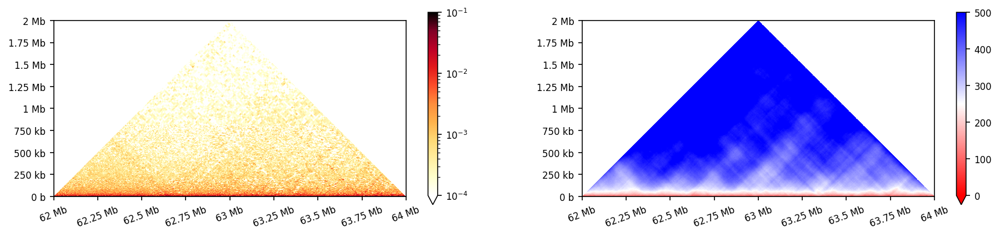

In [ ]:
from tqdm import tqdm
for name in domains:
    print(name)
    region = prod[name]['mei'].mei.config['region']
    chrom, start, end = parse_region(region)
    ref_map = prod[name]['mei'].get_reference_contact_map()

    w = 250
    vmin = 1e-4
    vmax = 1e-1
    
    f, ax = plt.subplots(1, 2, figsize=(15, 3))
    factor = 5
    contact_map = ContactMap(coarse_grain_map(ref_map, factor=factor), chrom=chrom, start=start, end=end, resolution=200*factor)
    contact_map.plot_contact_map_horizontal(vmin=vmin, vmax=vmax, ax=ax[0])

    factor = 10
    dists = []
    for d in tqdm(domains[name]):
        positions = np.vstack([d.positions[i:i+factor].mean(axis=0) for i in range(0, len(d.positions), factor)])
        dists += [get_distance_matrix(positions)]
    dists = np.median(dists, axis=0)
    dists = ContactMap(dists, chrom=chrom, start=start, end=end, resolution=200*factor)
    dists.plot_contact_map_horizontal(vmin=0, vmax=500, cmap='bwr_r', log_norm=False, ax=ax[1])
    plt.savefig(f'img/stochastic_average_{name}.pdf')
    plt.show()

# Domain sizes

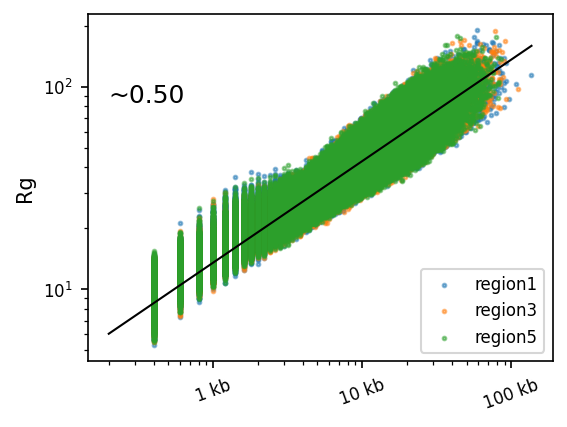

In [ ]:
sizes = {}
for name in main_names:
    sizes[name] = []
    for domain in domains_ins[name]:
        for cluster in range(domain.n_clusters):
            points = domain.positions[domain.labels == cluster]
            sizes[name] += [200*len(points)]
    sizes[name] = np.array(sizes[name])

rgs = {}
for name in main_names:
    rgs[name] = []
    for domain in domains_ins[name]:
        for cluster in range(domain.n_clusters):
            points = domain.positions[domain.labels == cluster]
            rgs[name] += [np.sqrt(np.sum((points - points.mean(axis=0, keepdims=True))**2) / len(points))]
    rgs[name] = np.array(rgs[name])

f, ax = plt.subplots(figsize=(4, 3))
for name in main_names:
    ax.scatter(sizes[name], rgs[name], s=3, label=stylized_names[name], alpha=0.5, rasterized=True)

all_rgs = np.concatenate([rgs[name] for name in main_names])
all_sizes = np.concatenate([sizes[name] for name in main_names])
popt, _ = curve_fit(power_law, all_sizes, all_rgs)
x = np.linspace(200, np.max(all_sizes))
ax.plot(x, power_law(x, *popt),  color='black', lw=1)
ax.text(x[0], power_law(x[len(x)//4], *popt), f'~{popt[1]:.2f}', color='black', fontsize=12, ha='left', va='bottom')

ax.set_yscale('log')
ax.set_xscale('log') 
ax.set_ylabel('Rg')
ax.legend()
format_ticks(ax, y=False)
#plt.savefig('img/insulated_domain_sizes_vs_rg.pdf')
plt.show()

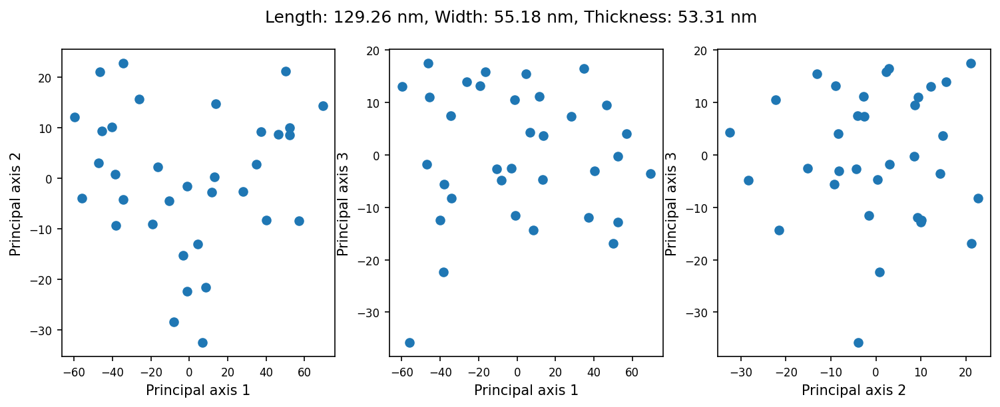

region1
Number of domains: 108425
Average size: 121.88 ± 381.40 nucleosomes
Length: 120.80 ± 102.24 nm
Width: 84.91 ± 71.60 nm
Thickness: 63.24 ± 55.49 nm
Aspect ratio (length/width): 1.44 ± 0.31
region3
Number of domains: 66430
Average size: 222.60 ± 861.16 nucleosomes
Length: 130.94 ± 139.76 nm
Width: 92.49 ± 100.07 nm
Thickness: 69.35 ± 79.14 nm
Aspect ratio (length/width): 1.44 ± 0.31
region5
Number of domains: 73841
Average size: 187.03 ± 725.16 nucleosomes
Length: 127.57 ± 129.45 nm
Width: 90.16 ± 93.79 nm
Thickness: 67.30 ± 73.60 nm
Aspect ratio (length/width): 1.45 ± 0.31
Overall average size: 168.13 ± 647.67 nucleosomes
Overall Length: 125.52 ± 121.53 nm
Overall Width: 88.50 ± 86.79 nm
Overall Thickness: 66.08 ± 68.05 nm
Overall Aspect ratio (length/width): 1.44 ± 0.31
region1
Number of domains: 317433
Average size: 40.13 ± 33.14 nucleosomes
Length: 104.65 ± 49.89 nm
Width: 63.78 ± 27.90 nm
Thickness: 44.90 ± 19.55 nm
Aspect ratio (length/width): 1.67 ± 0.45
region3
Number of 

In [ ]:
def length_width(points, plot=False):
    # points: (N, 3) array
    centered = points - points.mean(axis=0)
    cov = np.cov(centered, rowvar=False)
    eigvals, eigvecs = np.linalg.eigh(cov)
    # Sort eigenvectors by eigenvalues (descending)
    order = np.argsort(eigvals)[::-1]
    eigvecs = eigvecs[:, order]
    # Project points onto principal axes
    proj = centered @ eigvecs
    length = proj[:, 0].max() - proj[:, 0].min()
    width = proj[:, 1].max() - proj[:, 1].min()
    thickness = proj[:, 2].max() - proj[:, 2].min()

    if plot:
        f, ax = plt.subplots(1, 3, figsize=(12, 4))
        ax[0].scatter(proj[:, 0], proj[:, 1])
        ax[0].set_xlabel('Principal axis 1')
        ax[0].set_ylabel('Principal axis 2')
        ax[1].scatter(proj[:, 0], proj[:, 2])
        ax[1].set_xlabel('Principal axis 1')
        ax[1].set_ylabel('Principal axis 3')
        ax[2].scatter(proj[:, 1], proj[:, 2])
        ax[2].set_xlabel('Principal axis 2')
        ax[2].set_ylabel('Principal axis 3')
        f.suptitle(f'Length: {length:.2f} nm, Width: {width:.2f} nm, Thickness: {thickness:.2f} nm')
        plt.show()

    return length, width, thickness

def characterize_shapes(domains):
    all_lengths, all_widths, all_thicknesses, all_sizes = [], [], [], []
    for name, _domains in domains.items():
        print(name)
        lengths, widths, thicknesses, sizes = [], [], [], []
        for domain in _domains:
            for i in range(np.max(domain.labels)):
                positions = domain.positions[domain.labels == i]
                if len(positions) < 10:
                    continue
                length, width, thickness = length_width(positions)
                lengths.append(length)
                widths.append(width)
                thicknesses.append(thickness)
                sizes.append(len(positions))
        lengths = np.array(lengths)
        widths = np.array(widths)
        thicknesses = np.array(thicknesses)
        sizes = np.array(sizes)
        print(f'Number of domains: {len(lengths)}')
        print(f'Average size: {np.mean(sizes):.2f} ± {np.std(sizes):.2f} nucleosomes')
        print(f'Length: {np.mean(lengths):.2f} ± {np.std(lengths):.2f} nm')
        print(f'Width: {np.mean(widths):.2f} ± {np.std(widths):.2f} nm')
        print(f'Thickness: {np.mean(thicknesses):.2f} ± {np.std(thicknesses):.2f} nm')
        print(f'Aspect ratio (length/width): {np.mean(lengths / widths):.2f} ± {np.std(lengths / widths):.2f}')

        all_lengths.append(lengths)
        all_widths.append(widths)
        all_thicknesses.append(thicknesses)
        all_sizes.append(sizes)
    all_lengths = np.concatenate(all_lengths)
    all_widths = np.concatenate(all_widths)
    all_thicknesses = np.concatenate(all_thicknesses)
    all_sizes = np.concatenate(all_sizes)
    print(f'Overall average size: {np.mean(all_sizes):.2f} ± {np.std(all_sizes):.2f} nucleosomes')
    print(f'Overall Length: {np.mean(all_lengths):.2f} ± {np.std(all_lengths):.2f} nm')
    print(f'Overall Width: {np.mean(all_widths):.2f} ± {np.std(all_widths):.2f} nm')
    print(f'Overall Thickness: {np.mean(all_thicknesses):.2f} ± {np.std(all_thicknesses):.2f} nm')
    print(f'Overall Aspect ratio (length/width): {np.mean(all_lengths / all_widths):.2f} ± {np.std(all_lengths / all_widths):.2f}')
    return all_lengths, all_widths, all_thicknesses, all_sizes

points = domains_ins['region1'][0].positions[domains_ins['region1'][0].labels == 10]
length, width, thickness = length_width(points, plot=True)

characterize_shapes({k:v for k, v in domains.items() if k in main_names})
characterize_shapes({k:v for k, v in domains_ins.items() if k in main_names});

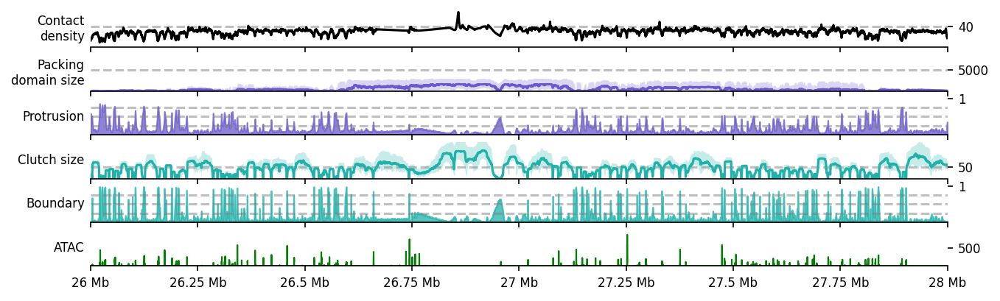

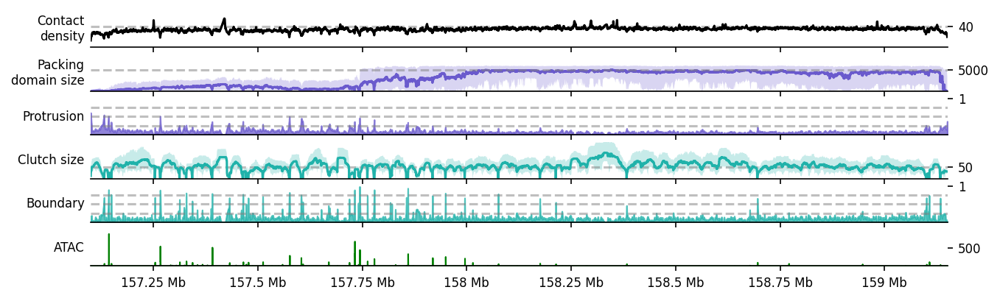

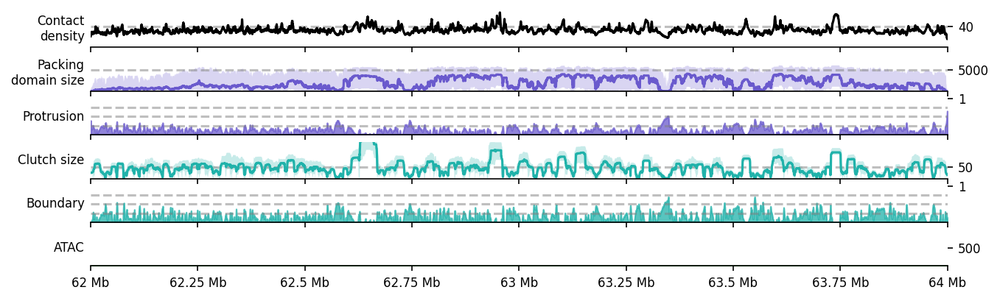

In [9]:
from neighbor_balance.ice import get_marginal

def get_sizes(labels):
    sizes = np.ones(labels.shape)
    for t, label in enumerate(labels):
        for i in np.unique(labels):
            if i < 0:
                continue
            mask = label == i
            sizes[t, mask] = np.sum(mask)
    return sizes

def add_grid(ax):
    for y in [0.25, 0.5, 0.75]:
        ax.axhline(y, c='gray', ls='--', alpha=0.5)

def plot_all_traces(name, show_sizes=True, width=10, height=3):
    region = prod[name]['mei'].mei.config['region']
    chrom, start, end = parse_region(region)
    ref_map = prod[name]['mei'].get_reference_contact_map()
    sim_map = prod[name]['mei'].get_precomputed_contact_map(prod[name]['iteration'])

    packing = np.array([d.labels for d in domains[name]])
    sections = np.array([d.labels for d in domains_ins[name]])

    atac =  f'/orcd/data/binz/001/belong/for_revisions/genomics_data/HCT116/ENCFF624HRW.bigWig'
    atac = load_bw(atac, chrom, start, end)
    atac = bin_track(atac, step=200)

    f, ax = plt.subplots(6 if show_sizes else 4, figsize=(width, height), sharex=True)
    
    # Contact density
    i = 0
    ax[i].axhline(40, c='gray', ls='--', alpha=0.5)
    ax[i].plot(np.arange(start, end, 200), 2*get_marginal(ref_map), c='black')
    #ax[i].plot(np.arange(start, end, 200), 2*get_marginal(sim_map), c='red', alpha=0.5)
    ax[i].set_ylim(0, 70)
    ax[i].yaxis.tick_right()
    ax[i].set_ylabel('Contact\ndensity', rotation=0, ha='right', va='center', size=8)
    ax[i].set_yticks([40])

    # Packing domain sizes
    if show_sizes:
        i += 1
        sizes = get_sizes(packing[::10])
        low = np.percentile(sizes, 25, axis=0)
        mid = np.percentile(sizes, 50, axis=0)
        high = np.percentile(sizes, 75, axis=0)
        ax[i].axhline(50, c='gray')
        ax[i].fill_between(np.arange(start, end, 200), low, high, facecolor='slateblue', alpha=0.25)
        ax[i].plot(np.arange(start, end, 200), mid, c='slateblue')
        ax[i].set_ylim(0, 8500)
        ax[i].set_yticks([5000])
        ax[i].axhline(5000, c='gray', ls='--', alpha=0.5)
        ax[i].set_ylabel('Packing\ndomain size', rotation=0, ha='right', va='center', size=8)

    # Protrusion
    i += 1
    p_loop = np.mean([d.labels == -1 for d in domains[name]], axis=0)
    ax[i].fill_between(np.arange(start, end, 200), 0, p_loop, color='slateblue', alpha=0.75)
    ax[i].set_ylim(0, 1)
    ax[i].yaxis.tick_right()
    ax[i].set_ylabel('Protrusion', rotation=0, ha='right', va='center', size=8)
    ax[i].set_yticks([1])
    add_grid(ax[i])

    # Insulation domain sizes
    if show_sizes:
        i += 1
        sizes = get_sizes(sections[::10])
        low = np.percentile(sizes, 25, axis=0)
        mid = np.percentile(sizes, 50, axis=0)
        high = np.percentile(sizes, 75, axis=0)
        ax[i].axhline(50, c='gray', ls='--', alpha=0.5)
        ax[i].fill_between(np.arange(start, end, 200), low, high, facecolor='lightseagreen', alpha=0.25)
        ax[i].plot(np.arange(start, end, 200), mid, c='lightseagreen')
        ax[i].set_ylim(0, 160)
        ax[i].set_yticks([50])
        ax[i].set_ylabel('Clutch size', rotation=0, ha='right', va='center', size=8)
    
    # Boundaries
    i += 1
    ax[i].fill_between(np.arange(start, end, 200), 0, np.mean(sections==-1, axis=0), alpha=0.75, color='lightseagreen')
    ax[i].set_ylim(0, 1)
    ax[i].set_yticks([1])
    ax[i].set_ylabel('Boundary', rotation=0, ha='right', va='center', size=8)
    add_grid(ax[i])

    # ATAC
    i += 1
    ax[i].fill_between(np.arange(start, end, 200), 0, atac, color='green')
    ax[i].set_ylim(0, 1000)
    ax[i].set_yticks([500])
    ax[i].set_ylabel('ATAC', rotation=0, ha='right', va='center', size=8)

    for a in ax:
        a.yaxis.tick_right()
        a.spines[['top', 'left', 'right']].set_visible(False)

    ax[-1].set_xlim(start, end)
    format_ticks(ax[-1], y=False, rotate=False)
    #ax[0].set_title(stylized_names[name])
    return ax

for name in main_names:
    ax = plot_all_traces(name)
    plt.savefig(f'img/insulation_domains_sizes_{name}.pdf')
    plt.show()

In [12]:
from scipy.stats import gaussian_kde

def myhist(data, bins, ax=None, density=True, bw = 0.05, alpha=1, lw=1, n_points=1000, weights=None, **kwargs):
    p = plt if ax is None else ax
    if data.min() < bins[0] or data.max() > bins[-1]:
        print(f'Warning: data outside range ({data.min()} to {data.max()} vs {bins[0]} to {bins[-1]})')
    
    cov = np.cov(np.log10(data), aweights=weights if weights is not None else None)
    kde = gaussian_kde(np.log10(data), weights=weights, bw_method=bw / cov**0.5)

    x = np.arange(1, 500) * 200 # plot every 200 bp from 200 to 100 kb
    x = np.concatenate([x, np.logspace(np.log10(x[-1]), np.log10(bins[-1]), n_points)])
    y = kde(np.log10(x))
    p.plot(x, y, lw=lw, alpha=alpha, **kwargs)

[[0.0001]]
region1 1574800 10000
[[1.e-04]]
[[0.0001]]
[[0.0001]]
region3 1793800 10252
[[0.0001]]
[[0.0001]]
[[1.e-04]]
region5 1712800 10000
[[0.0001]]
[[0.0001]]


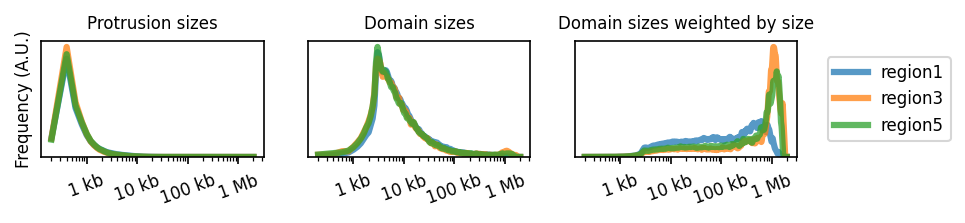

In [ ]:
mpl.rcParams['ytick.labelsize']

test_old_hist = False

for name_filter, plot_fname in [(lambda x: True, 'img/domain_sizes_hct116.pdf')]:
    bins = np.logspace(np.log10(199), np.log10(2_000_000), 21)
    f, axs = plt.subplots(1, 3, sharex=True, figsize=(6.5, 1))
    for name, domain in domains.items():
        if not name_filter(name):
            continue

        # Linkers.
        linkers = [Domains(d.positions.copy(), get_segments(d.labels == -1)) for d in domain]
        w = np.array([np.sum(_domain.labels==i) for _domain in linkers for i in range(_domain.n_clusters)])
        w *= 200
        myhist(w, bins=bins, label=stylized_names[name], ax=axs[0], weights=np.zeros(w.shape) + 1 / len(w), density=False)
        if test_old_hist:
            oldmyhist(w, bins=bins, label=stylized_names[name], ax=axs[0], weights=np.zeros(w.shape) + 1 / len(w), density=False)

        # Domains
        w = np.array([np.sum(_domain.labels==i) for _domain in domain for i in range(_domain.n_clusters)])
        w *= 200
        print(name, np.max(w), len(domain[0].positions))
        myhist(w, bins=bins, label=stylized_names[name], ax=axs[1], weights=np.zeros(w.shape) + 1 / len(w), density=False)
        myhist(w, bins=bins, label=stylized_names[name], ax=axs[2], weights=w/sum(w), density=False)

        if test_old_hist:
            oldmyhist(w, bins=bins, label=stylized_names[name], ax=axs[1], weights=np.zeros(w.shape) + 1 / len(w), density=False)
            oldmyhist(w, bins=bins, label=stylized_names[name], ax=axs[2], weights=w/sum(w), density=False)

    axs[0].set_title('Protrusion sizes', fontsize=8)
    axs[1].set_title('Domain sizes', fontsize=8)
    axs[2].set_title('Domain sizes weighted by size', fontsize=8)
    axs[0].set_ylabel('Frequency (A.U.)', fontsize=8)
    axs[1].set_xscale('log')

    axs[2].legend(fontsize=8, loc='center left', bbox_to_anchor=(1.1, 0.5))
    for ax in axs:
        ax.set_yticks([])
        format_ticks(ax, y=False)
        ax.set_ylim(0)
    plt.savefig(plot_fname)
    plt.show()

[1.99000000e+02 2.92153066e+02 4.28911627e+02 6.29687673e+02
 9.24448161e+02 1.35718776e+03 1.99249530e+03 2.92519403e+03
 4.29449449e+03 6.30477251e+03 9.25607346e+03 1.35888957e+04
 1.99499373e+04 2.92886199e+04 4.29987944e+04 6.31267820e+04
 9.26767985e+04 1.36059351e+05 1.99749530e+05 2.93253455e+05
 4.30527115e+05 6.32059380e+05 9.27930078e+05 1.36229958e+06
 2.00000000e+06]
region1 48000
[[0.0001]]
region3 29800
[[0.0001]]
region5 35200
[[1.e-04]]


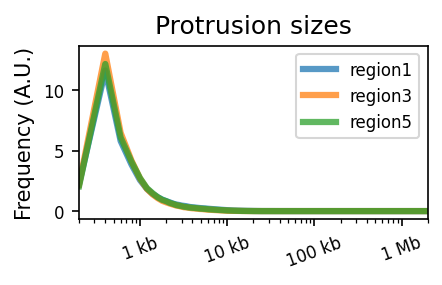

region1 136200
[[1.e-04]]
region3 111400
[[0.0001]]
region5 85000
[[0.0001]]


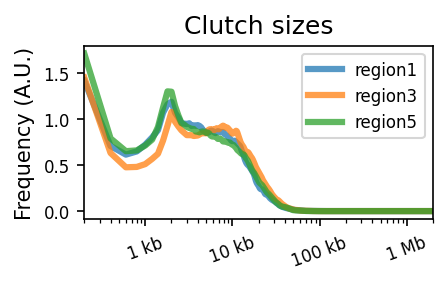

region1 1574800
[[1.e-04]]
region3 1793800
[[0.0001]]
region5 1712800
[[0.0001]]


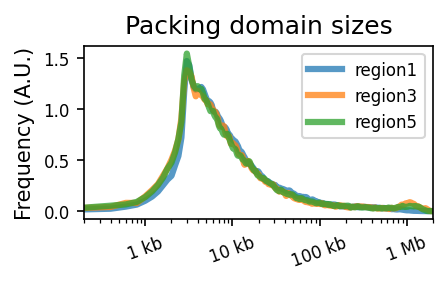

region1 1574800
[[0.0001]]
region3 1793800
[[0.0001]]
region5 1712800
[[0.0001]]


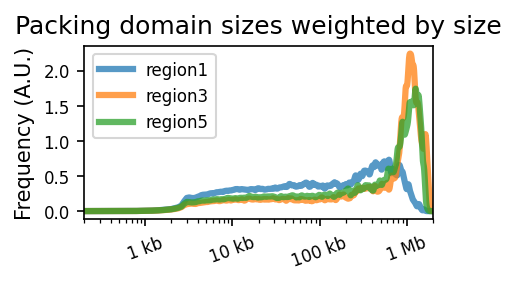

In [ ]:
def plot_linkers(domains, ax, bins, name, **kwargs):
    linkers = [Domains(d.positions.copy(), get_segments(d.labels == -1)) for d in domain]
    w = np.array([np.sum(_domain.labels==i) for _domain in linkers for i in range(_domain.n_clusters)])
    w *= 200
    print(name, np.max(w))
    myhist(w, bins=bins, label=stylized_names[name], ax=ax, weights=np.zeros(w.shape) + 1 / len(w), density=False, **kwargs)

def plot_packing_domains(domains, ax, bins, name, weighted=False, **kwargs):
    # Domains
    w = np.array([np.sum(_domain.labels==i) for _domain in domain for i in range(_domain.n_clusters)])
    w *= 200
    print(name, np.max(w))
    if weighted:
        myhist(w, bins=bins, label=stylized_names[name], ax=ax, weights=w/sum(w), density=False, **kwargs)
    else:
        myhist(w, bins=bins, label=stylized_names[name], ax=ax, weights=np.zeros(w.shape) + 1 / len(w), density=False, **kwargs)

def plot_insulated_domains(domains, ax, bins, name, **kwargs):
    insulation = insulations[name]
    mask = insulation[10] > median_insulation[10] - 1.0
    domain = [Domains(np.zeros((mask.shape[1], 3)), get_segments(m)) for m in mask]

    w = np.array([np.sum(_domain.labels==i) for _domain in domain for i in range(_domain.n_clusters)])
    w *= 200
    print(name, np.max(w))
    myhist(w, bins=bins, label=stylized_names[name], ax=ax, weights=np.zeros(w.shape) + 1 / len(w), density=False, **kwargs)


bins = np.logspace(np.log10(199), np.log10(2_000_000), 25)
print(bins)

for name_filter, group_name in [(lambda x: True, 'hct116')]:
    
    plot_fname = f'img/domain_sizes_{group_name}_{{}}.pdf'
                            
    f, ax = plt.subplots(1, sharex=True, figsize=(3, 1.5))
    for name, domain in domains.items():
        if not name_filter(name): continue
        plot_linkers(domain, ax, bins, name)
    ax.set_title('Protrusion sizes')
    ax.set_ylabel('Frequency (A.U.)')
    ax.set_xscale('log')
    ax.legend()
    ax.set_xlim(200, 2_000_000)
    format_ticks(ax, y=False)
    plt.savefig(plot_fname.format('protrusions'))
    plt.show()

    f, ax = plt.subplots(1, sharex=True, figsize=(3, 1.5))
    for name, domain in domains.items():
        if not name_filter(name): continue
        plot_insulated_domains(domain, ax, bins, name)
    ax.set_title('Clutch sizes')
    ax.set_ylabel('Frequency (A.U.)')
    ax.set_xscale('log')
    ax.legend()
    ax.set_xlim(200, 2_000_000)
    format_ticks(ax, y=False)
    plt.savefig(plot_fname.format('insulated'))
    plt.show()

    f, ax = plt.subplots(1, sharex=True, figsize=(3, 1.5))
    for name, domain in domains.items():
        if not name_filter(name): continue
        plot_packing_domains(domain, ax, bins, name)
    ax.set_title('Packing domain sizes')
    ax.set_ylabel('Frequency (A.U.)')
    ax.set_xscale('log')
    ax.legend()
    ax.set_xlim(200, 2_000_000)
    format_ticks(ax, y=False)
    plt.savefig(plot_fname.format('packing'))
    plt.show()

    f, ax = plt.subplots(1, sharex=True, figsize=(3, 1.5))
    for name, domain in domains.items():
        if not name_filter(name): continue
        plot_packing_domains(domain, ax, bins, name, weighted=True)
    ax.set_title('Packing domain sizes weighted by size')
    ax.set_ylabel('Frequency (A.U.)')
    ax.set_xscale('log')
    ax.legend()
    ax.set_xlim(200, 2_000_000)
    format_ticks(ax, y=False)
    plt.savefig(plot_fname.format('packing_weighted'))
    plt.show()

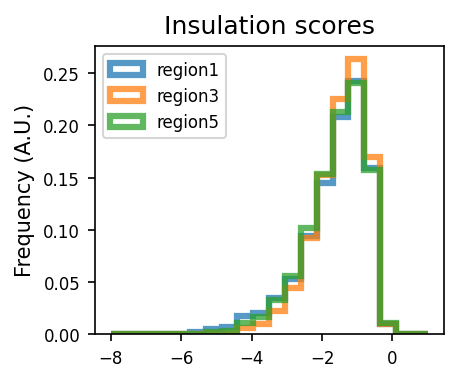

In [ ]:
bins = np.linspace(-8, 1, 21)

for name_filter, plot_fname in [(lambda x: name in main_names, 'img/insulation_scores_hct116.pdf')]:
    f, ax = plt.subplots(1, sharex=True, figsize=(3, 2.5))

    for name, domain in domains.items():
        if not name_filter(name): continue
        insulation = insulations[name][10].flatten()
        oldmyhist(insulation, bins=bins, label=stylized_names[name], ax=ax, weights=np.zeros(insulation.shape) + 1 / len(insulation), density=False)

    ax.set_title('Insulation scores')
    ax.set_ylabel('Frequency (A.U.)')
    ax.legend()
    plt.savefig(plot_fname)
    plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from maxentnuc.analysis.analysis import *
import os
from neighbor_balance.plotting import ContactMap, format_ticks, get_distance_average, apply_matplotlib_style, stylize_gene_name
from maxentnuc.simulation.upper_triangular import triu_to_full

def kernel_smooth(x, y, bw):
    d = np.abs(x.reshape(-1, 1) - x.reshape(1, -1))
    w = np.exp(-d**2 / (2*bw**2))
    w /= w.sum(axis=1)
    return np.sum(w * y, axis=1)

def add_contact_scaling(axs, cmap, name, color=None):
    ContactMap(cmap, 'chrom', 0, cmap.shape[0]*200, 200).plot_distance_average(label=name, ax=axs[0], color=color)
    y = get_distance_average(cmap, show_self=False)
    x = np.arange(200, (y.shape[0] + 1)*200, 200)
    y_smooth = kernel_smooth(np.log10(x), y, 0.1)
    slope_smooth = (np.log10(y_smooth[1:]) - np.log10(y_smooth[:-1])) / (np.log10(x[1:]) - np.log10(x[:-1]))
    axs[1].plot((x[1:] + x[:-1]) / 2, slope_smooth, label=name, color=color)

def plot_contact_scaling(conditions, ref_cmap=None, ref_cmap_name=None, sim_contacts_suffix='_simulated_contact_map.npy'):
    f, axs = plt.subplots(2, figsize=(3, 2.5), sharex='col', gridspec_kw={'hspace': 0.06})
    
    if ref_cmap is not None:
        add_contact_scaling(axs, ref_cmap, ref_cmap_name, color='black')
    for name, info in conditions.items():
        if 'contacts' in info:
            fname = info['contacts']
        else:
            fname = f'{info["base"]}{sim_contacts_suffix}'
        cmap = triu_to_full(np.load(fname))
        add_contact_scaling(axs, cmap, name)

    axs[0].set_ylim(1e-5, 1)
    axs[0].legend(bbox_to_anchor=(1, 1))
    axs[1].set_ylim(-2.5, 0)
    axs[0].set_ylabel('Contact frequency')
    axs[1].set_ylabel('Slope')
    format_ticks(axs[1], y=False)
    return axs


def plot_distance_scaling(conditions):
    separations = np.unique(np.logspace(0, 7, 117).astype(int))
    res = 1
    bp_per_bead = 200

    def power_law(x, a, b):
        return a*x**b

    f, ax = plt.subplots(2, figsize=(3, 2.5), sharex='col', gridspec_kw={'hspace': 0.06})
    for name, info in conditions.items():
        pad = 250
        skip = 11
        positions = info['mei'].get_positions(info['iteration'], skip=skip)
        positions = positions.reshape(-1, positions.shape[2], 3)
        positions = positions[:, pad:-pad]
        n = positions[0].shape[0]
        _separations = np.concatenate([separations[separations < n], [n - 1]])
        y = []
        for separation in _separations:
            distances = get_distances(positions, separation)
            y += [np.mean(distances)]
        y = np.array(y)
        x = bp_per_bead * res * _separations

        popt, _ = curve_fit(power_law, x, y)
        a, b = popt
        print(name, a, b)
        print(x[-1])
        ax[0].plot(x, y, label=name)
        #ax[0].scatter(x, y)

        slope = (np.log10(y[1:]) - np.log10(y[:-1])) / (np.log10(x[1:]) - np.log10(x[:-1]))
        ax[1].plot((x[1:] + x[:-1]) / 2, slope, label=name)

    ax[0].set_yscale('log')
    ax[0].set_xscale('log')
    ax[0].legend(fontsize=6, loc='upper left')
    format_ticks(ax[1], y=False)
    ax[0].set_ylabel('Distance (nm)')
    
    ax[1].set_ylabel('Slope')
    ax[1].set_ylim(0, 0.75)
    ax[0].set_xlim(200, 2_000_000)
    ax[1].axhline(1/3, c='grey', ls='--')
    ax[1].axhline(1/2, c='grey', ls='--')
    ax[1].set_yticks([0, 1/3, 1/2], ['0', '1/3', '1/2'])
    return f, ax

    
def plot_concentrations(conditions, cuts=(25, 30, 40, 50, 60, 70, 80, 90, 100)):
    means = np.zeros((len(conditions), len(cuts)))
    names = []
    for j, (name, info) in enumerate(conditions.items()):
        names += [name]
        skip = 11
        pad = 250
        positions = info['mei'].get_positions(info['iteration'], skip=skip)
        positions = positions.reshape(-1, positions.shape[2], 3)
        positions = positions[:, pad:-pad]
        for i, cut in enumerate(cuts):
            neighbors = count_neighbors(positions, radius=cut).flatten()
            conc = to_micromolar(neighbors + 1, 4/3 * np.pi * cut**3)
            means[j, i] = np.mean(conc)

    plt.figure(figsize=(3, 2))
    plt.plot(cuts, means.T, label=names)
    plt.legend()
    plt.xlabel('radius (nm)')
    plt.ylabel('concentration (µM)')
    plt.ylim(0)

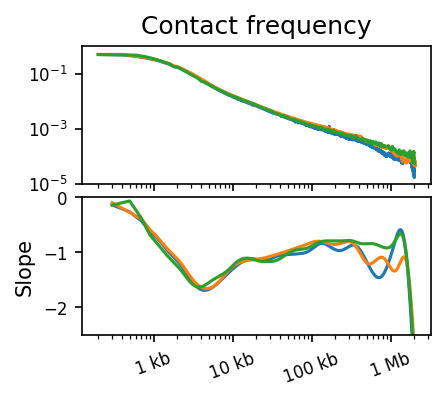

In [ ]:
f, axs = plt.subplots(2, figsize=(3, 2.5), sharex='col', gridspec_kw={'hspace': 0.1})
for name, info in prod.items():
    cmap = info['mei'].get_reference_contact_map()
    add_contact_scaling(axs, cmap, name)
axs[0].set_ylim(1e-5, 1)
axs[1].set_ylim(-2.5, 0)
axs[0].set_title('Contact frequency')
axs[1].set_ylabel('Slope')
format_ticks(axs[1], y=False)
plt.savefig('img/scaling_contacts_hct116.pdf')
plt.show()

INFO:MDAnalysis.core.universe:The attribute(s) types, masses have already been read from the topology file. The guesser will only guess empty values for this attribute, if any exists. To overwrite it by completely guessed values, you can pass the attribute to the force_guess parameter instead of the to_guess one
INFO:MDAnalysis.guesser.base:There is no empty types values. Guesser did not guess any new values for types attribute
INFO:MDAnalysis.guesser.base:There is no empty masses values. Guesser did not guess any new values for masses attribute
INFO:MDAnalysis.core.universe:The attribute(s) types, masses have already been read from the topology file. The guesser will only guess empty values for this attribute, if any exists. To overwrite it by completely guessed values, you can pass the attribute to the force_guess parameter instead of the to_guess one
INFO:MDAnalysis.guesser.base:There is no empty types values. Guesser did not guess any new values for types attribute
INFO:MDAnalysis.

region1 4.248336556554243 0.37547546444661123
1899800


INFO:MDAnalysis.core.universe:The attribute(s) types, masses have already been read from the topology file. The guesser will only guess empty values for this attribute, if any exists. To overwrite it by completely guessed values, you can pass the attribute to the force_guess parameter instead of the to_guess one
INFO:MDAnalysis.guesser.base:There is no empty types values. Guesser did not guess any new values for types attribute
INFO:MDAnalysis.guesser.base:There is no empty masses values. Guesser did not guess any new values for masses attribute
INFO:MDAnalysis.core.universe:The attribute(s) types, masses have already been read from the topology file. The guesser will only guess empty values for this attribute, if any exists. To overwrite it by completely guessed values, you can pass the attribute to the force_guess parameter instead of the to_guess one
INFO:MDAnalysis.guesser.base:There is no empty types values. Guesser did not guess any new values for types attribute
INFO:MDAnalysis.

region3 3.856574871836923 0.3702446540723032
1950200


INFO:MDAnalysis.core.universe:The attribute(s) types, masses have already been read from the topology file. The guesser will only guess empty values for this attribute, if any exists. To overwrite it by completely guessed values, you can pass the attribute to the force_guess parameter instead of the to_guess one
INFO:MDAnalysis.guesser.base:There is no empty types values. Guesser did not guess any new values for types attribute
INFO:MDAnalysis.guesser.base:There is no empty masses values. Guesser did not guess any new values for masses attribute
INFO:MDAnalysis.core.universe:The attribute(s) types, masses have already been read from the topology file. The guesser will only guess empty values for this attribute, if any exists. To overwrite it by completely guessed values, you can pass the attribute to the force_guess parameter instead of the to_guess one
INFO:MDAnalysis.guesser.base:There is no empty types values. Guesser did not guess any new values for types attribute
INFO:MDAnalysis.

region5 9.148493457858088 0.2982938634903821
1899800


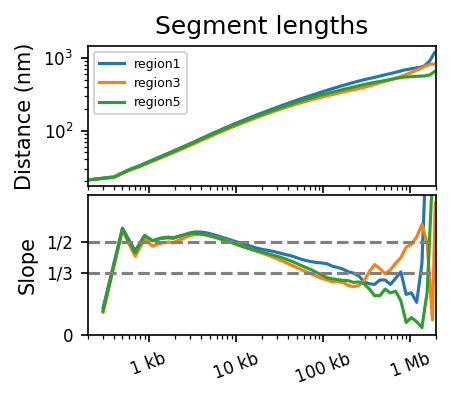

In [ ]:
f, ax = plot_distance_scaling(prod)
ax[0].set_title('Segment lengths')
plt.savefig('img/scaling_distances_hct116.pdf')
plt.show()

/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/MDAnalysis/coordinates/DCD.py:165: DeprecationWarning: DCDReader currently makes independent timesteps by copying self.ts while other readers update self.ts inplace. This behavior will be changed in 3.0 to be the same as other readers. Read more at https://github.com/MDAnalysis/mdanalysis/issues/3889 to learn if this change in behavior might affect you.
  warnings.warn("DCDReader currently makes independent timesteps"
INFO:MDAnalysis.core.universe:The attribute(s) types, masses have already been read from the topology file. The guesser will only guess empty values for this attribute, if any exists. To overwrite it by completely guessed values, you can pass the attribute to the force_guess parameter instead of the to_guess one
INFO:MDAnalysis.guesser.base:There is no empty types values. Guesser did not guess any new values for types attribute
INFO:MDAnalysis.guesser.base:There is no empty masses values. Guesser did not

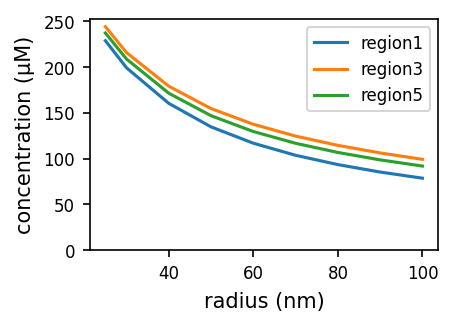

In [ ]:
plot_concentrations(prod)
plt.savefig('img/scaling_conc_hct116.pdf')
plt.show()

# Domain densities

In [6]:
from tqdm import tqdm

def get_concentrations(positions, radius):
    tree = cKDTree(positions)
    neighbors = tree.query_ball_tree(tree, radius)
    counts = np.array([len(n) for n in neighbors])
    conc = to_micromolar(counts, 4/3 * np.pi * radius**3)
    return conc

sizes = {}
for name in main_names:
    sizes[name] = []
    for domain in domains[name]:
        for cluster in range(domain.n_clusters):
            points = domain.positions[domain.labels == cluster]
            sizes[name] += [200*len(points)]
    sizes[name] = np.array(sizes[name])

rgs = {}
for name in main_names:
    rgs[name] = []
    for domain in domains[name]:
        for cluster in range(domain.n_clusters):
            points = domain.positions[domain.labels == cluster]
            rgs[name] += [np.sqrt(np.sum((points - points.mean(axis=0, keepdims=True))**2) / len(points))]
    rgs[name] = np.array(rgs[name])

avgconc = {}
maxconc = {}
for name in main_names:
    avgconc[name] = []
    maxconc[name] = []
    for domain in tqdm(domains[name]):
        conc = get_concentrations(domain.positions, radius=40)
        for cluster in range(domain.n_clusters):
            avgconc[name] += [np.mean(conc[domain.labels == cluster])]
            maxconc[name] += [np.max(conc[domain.labels == cluster])]
    avgconc[name] = np.array(avgconc[name])
    maxconc[name] = np.array(maxconc[name])

100%|██████████| 1600/1600 [00:49<00:00, 32.50it/s]


region1 Rg: 146.56 ± 44.95
region3 Rg: 174.19 ± 60.24
region5 Rg: 168.58 ± 58.95


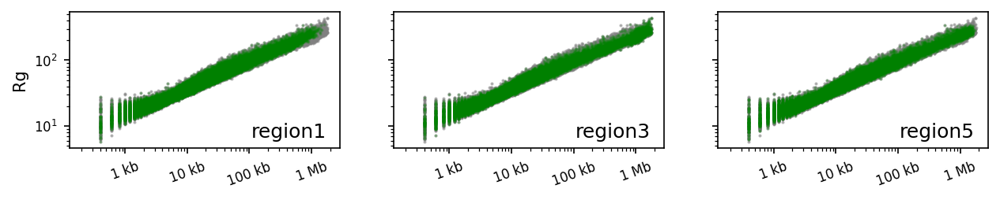

region1 Max. conc.: 389.78 ± 41.29
region3 Max. conc.: 407.03 ± 42.44
region5 Max. conc.: 409.42 ± 45.61


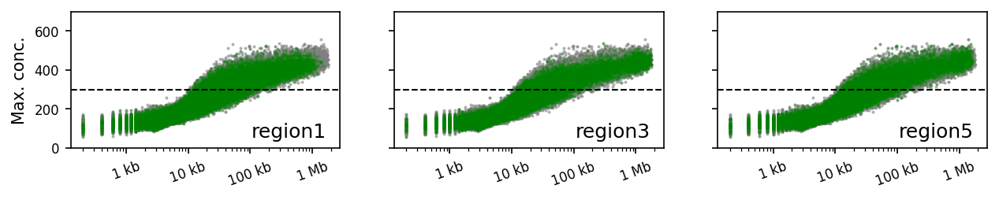

region1 Avg. conc.: 190.72 ± 12.13
region3 Avg. conc.: 196.66 ± 12.46
region5 Avg. conc.: 195.03 ± 11.95


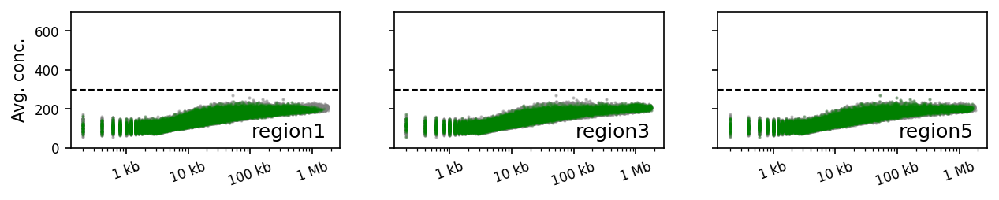

In [7]:
for method, values in zip(['Rg', 'Max. conc.', 'Avg. conc.'], [rgs, maxconc, avgconc]):
    f, axs = plt.subplots(1, len(main_names), figsize=(10, 1.5), sharey=True, sharex=True,)

    for name, ax in zip(main_names, axs):
        for name2 in main_names:
            ax.scatter(sizes[name2], values[name2], s=1, alpha=0.5, c='gray', rasterized=True)

        ax.scatter(sizes[name], values[name], s=1, label=stylized_names[name], alpha=0.2, c='green', rasterized=True)
        if method == 'Rg':
            ax.set_yscale('log')
        else:
            ax.set_ylim(0, 700)
            ax.axhline(300, color='k', ls='--', lw=1)
        ax.set_xscale('log')
        format_ticks(ax, y=False)
        ax.text(0.95, 0.05, stylized_names[name], transform=ax.transAxes,
                fontsize=12, verticalalignment='bottom', horizontalalignment='right')
        mask = sizes[name] > 100_000
        print(f'{name} {method}: {np.mean(values[name][mask]):.2f} ± {np.std(values[name][mask]):.2f}')
    axs[0].set_ylabel(method)
    #plt.savefig(f'img/density_{method}.pdf', bbox_inches='tight')
    plt.show()

Large fit: [1.19144746 0.38366477]
Small fit: [0.6634815  0.43668781]


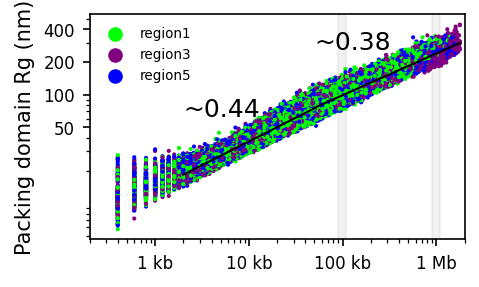

In [38]:
values = rgs

colors = {
    'region1': 'lime',
    'region3': 'purple',
    'region5': 'blue'
}

f, ax = fixed_panel_grid(1, 1, panel_width_in=2.5, panel_height_in=1.5,
                         left_in=0.6, top_in=0.25, bottom_in=0.25)
ax = ax[0, 0]

all_diameters = np.concatenate([values[name] for name in main_names])
all_counts = np.concatenate([sizes[name] for name in main_names])
all_colors = np.concatenate([[colors[name]]*len(values[name]) for name in main_names])

np.random.seed(0)
order = np.random.permutation(len(all_diameters))
ax.scatter(all_counts[order], all_diameters[order], c=all_colors[order], s=1, alpha=1, rasterized=True)
ax.set_yscale('log')
ax.set_xscale('log') 
ax.set_ylabel('Packing domain Rg (nm)')
ax.set_xlim(200, 2_000_000)
format_ticks(ax, y=False, rotate=False)

breakpoint = 50_000
mask = ~np.isnan(all_diameters) & (all_counts > breakpoint)
popt, _ = curve_fit(power_law, all_counts[mask], all_diameters[mask])
x = np.linspace(breakpoint, np.max(all_counts))
print('Large fit:', popt)
ax.plot(x, power_law(x, *popt),  color='black', lw=1)
ax.text(x[0], power_law(x[len(x)//2], *popt), f'~{popt[1]:.2f}',
                color='black', fontsize=12, ha='left', va='bottom')

mask = ~np.isnan(all_diameters) & (all_counts < breakpoint)
popt, _ = curve_fit(power_law, all_counts[mask], all_diameters[mask])
x = np.linspace(2_000, breakpoint)
print('Small fit:', popt)
ax.plot(x, power_law(x, *popt), color='black', lw=1)
ax.text(x[0], power_law(x[len(x)//2], *popt), f'~{popt[1]:.2f}',
color='black', fontsize=12, ha='left', va='bottom')
ax.set_yticks([50, 100, 200, 400])
ax.set_yticklabels([50, 100, 200, 400])
ax.axvspan(90_000, 110_000, color='gray', alpha=0.1, zorder=-1)
ax.axvspan(900_000, 1_100_000, color='gray', alpha=0.1, zorder=-1)

for name, color in colors.items():
    ax.scatter([], [], color=color, label=name)
ax.legend(loc='upper left', fontsize=6.5, frameon=False)

f.savefig(f'img/density_Rg_merged_hct116.pdf', bbox_inches=f.bbox_inches, dpi=300)
plt.show()

region1 252.47005 975100.0
region3 223.10083 1006900.0
region5 235.88213 998400.0
1v3 TtestResult(statistic=np.float64(9.388316740296368), pvalue=np.float64(1.6184608786584032e-19), df=np.float64(548.0))
1v5 TtestResult(statistic=np.float64(6.502208351953475), pvalue=np.float64(2.3694538331689633e-10), df=np.float64(399.0))
3v5 TtestResult(statistic=np.float64(-5.385117397041736), pvalue=np.float64(9.612964646619492e-08), df=np.float64(773.0))


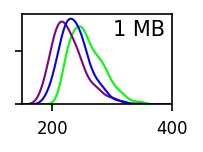

TransformedBbox(
    Bbox(x0=0.0, y0=0.0, x1=1.5, y1=1.1),
    Affine2D().scale(150.0))
region1 96.36893 99000.0
region3 97.315994 100000.0
region5 97.357285 98800.0
1v3 TtestResult(statistic=np.float64(-1.5368751555193025), pvalue=np.float64(0.12456911045178996), df=np.float64(1290.0))
1v5 TtestResult(statistic=np.float64(-1.1326420939745359), pvalue=np.float64(0.25756540989300597), df=np.float64(1352.0))
3v5 TtestResult(statistic=np.float64(0.405367121443909), pvalue=np.float64(0.6852974339527174), df=np.float64(966.0))


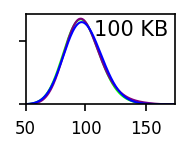

TransformedBbox(
    Bbox(x0=0.0, y0=0.0, x1=1.5, y1=1.1),
    Affine2D().scale(150.0))


In [33]:
from scipy.stats import ttest_ind

values = rgs

for size, low, high, bins  in [('1 MB', 900_000, 1_100_000, np.linspace(150, 400, 201)),
                                ('100 KB', 90_000, 110_000, np.linspace(50, 175, 201))]:
    f, ax = fixed_panel_grid(1, 1, panel_width_in=1, panel_height_in=0.6,
                             top_in=0.25, bottom_in=0.25, left_in=0.25, right_in=0.25)
    ax = ax[0, 0]
    _sizes = {}
    for name in main_names:
        mask = (sizes[name] > low) & (sizes[name] < high)
        _sizes[name] = values[name][mask]
        print(name, np.median(values[name][mask]), np.median(sizes[name][mask]))
        myhist(values[name][mask], bins=bins, alpha=1, label=stylized_names[name],  ax=ax, bw=10, color=colors[name])

    print('1v3', ttest_ind(_sizes['region1'], _sizes['region3']))
    print('1v5', ttest_ind(_sizes['region1'], _sizes['region5']))
    print('3v5', ttest_ind(_sizes['region3'], _sizes['region5']))

    #plt.legend()
    #plt.xlabel(f'{size} packing domain Rg (nm)')
    ax.text(0.95, 0.95, size, ha='right', va='top', transform=ax.transAxes)
    ax.set_ylim(0, None)
    ax.set_xlim(bins[0], bins[-1])
    ax.set_yticklabels([])
    f.savefig(f'img/density_Rg_{size.replace(" ", "")}_hct116.pdf', bbox_inches=f.bbox_inches)
    plt.show()
    print(f.bbox)

region1: 427.4 (400.8-464.6), 975100.0
region3: 439.8 (408.8-470.8), 1006900.0
region5: 446.0 (408.8-477.0), 998400.0
1v3 TtestResult(statistic=np.float64(-2.676469354524444), pvalue=np.float64(0.007662997745228495), df=np.float64(548.0))
1v5 TtestResult(statistic=np.float64(-4.091020180641774), pvalue=np.float64(5.198019198180738e-05), df=np.float64(399.0))
3v5 TtestResult(statistic=np.float64(-2.8108632512508955), pvalue=np.float64(0.005065882437452483), df=np.float64(773.0))


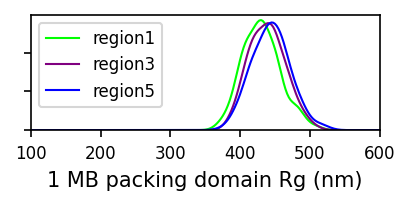

region1: 353.1 (309.7-403.9), 99000.0
region3: 353.1 (309.7-402.6), 100000.0
region5: 353.1 (303.5-421.2), 98800.0
1v3 TtestResult(statistic=np.float64(1.066380973767985), pvalue=np.float64(0.2864509947583494), df=np.float64(1290.0))
1v5 TtestResult(statistic=np.float64(-2.6164314843317404), pvalue=np.float64(0.008984441900311849), df=np.float64(1352.0))
3v5 TtestResult(statistic=np.float64(-3.12314686166965), pvalue=np.float64(0.0018425673794269508), df=np.float64(966.0))


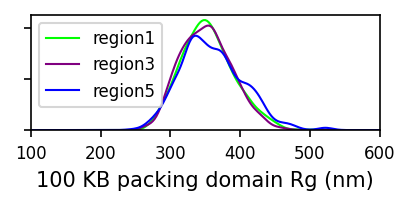

region1: 196.6 (189.4-204.0), 975100.0
region3: 205.3 (195.9-216.3), 1006900.0
region5: 201.3 (193.2-209.6), 998400.0
1v3 TtestResult(statistic=np.float64(-10.095728646654155), pvalue=np.float64(4.286216745758283e-22), df=np.float64(548.0))
1v5 TtestResult(statistic=np.float64(-6.054979004376787), pvalue=np.float64(3.244453363797117e-09), df=np.float64(399.0))
3v5 TtestResult(statistic=np.float64(8.106579023195035), pvalue=np.float64(2.034233467686193e-15), df=np.float64(773.0))


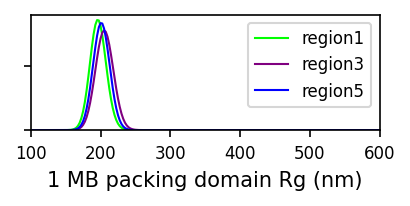

region1: 181.6 (166.5-202.6), 99000.0
region3: 180.6 (166.4-197.2), 100000.0
region5: 182.5 (165.7-203.4), 98800.0
1v3 TtestResult(statistic=np.float64(1.980683665233596), pvalue=np.float64(0.04783888728026638), df=np.float64(1290.0))
1v5 TtestResult(statistic=np.float64(-1.3945327411958763), pvalue=np.float64(0.16338588030501877), df=np.float64(1352.0))
3v5 TtestResult(statistic=np.float64(-2.958149640036432), pvalue=np.float64(0.003170342381214978), df=np.float64(966.0))


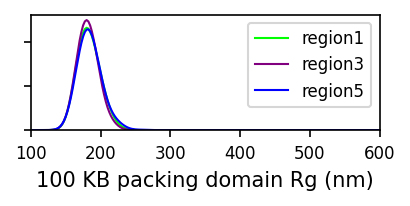

In [33]:
for values in [maxconc, avgconc]:
    for size, low, high, bins  in [('1 MB', 900_000, 1_100_000, np.linspace(100, 600, 201)),
                                    ('100 KB', 90_000, 110_000, np.linspace(100, 600, 201))]:
        f, ax = plt.subplots(figsize=(3, 1))
        _sizes = {}
        for name in main_names:
            mask = (sizes[name] > low) & (sizes[name] < high)
            _sizes[name] = values[name][mask]
            print(f'{name}: {np.median(values[name][mask]):.1f} ({np.percentile(values[name][mask], 10):.1f}-{np.percentile(values[name][mask], 90):.1f}), {np.median(sizes[name][mask]):.1f}')
            myhist(values[name][mask], bins=bins, alpha=1, label=stylized_names[name],  ax=ax, bw=10, color=colors[name])

        print('1v3', ttest_ind(_sizes['region1'], _sizes['region3']))
        print('1v5', ttest_ind(_sizes['region1'], _sizes['region5']))
        print('3v5', ttest_ind(_sizes['region3'], _sizes['region5']))

        plt.legend()
        plt.xlabel(f'{size} packing domain Rg (nm)')
        plt.ylim(0, None)
        plt.xlim(bins[0], bins[-1])
        ax.set_yticklabels([])
        #plt.savefig(f'img/density_Rg_{size.replace(" ", "")}_hct116.pdf')
        plt.show()